In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
%matplotlib widget
import ssm
import copy
from tqdm import tqdm
import pickle 
import matplotlib.gridspec as gridspec
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, leaves_list, dendrogram, fcluster
import seaborn as sns
import ipywidgets as widgets
from IPython.display import display
from ssm.util import random_rotation, find_permutation
from ipywidgets import interact, IntSlider
import sys
import glob
sys.path.append("/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/")
sys.path.append('/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/')
from collections import defaultdict
import random 
from scipy.ndimage import gaussian_filter1d
from get_data.read_neuro_beh_data import get_exp_features, load_json
from get_data.process_neural_data import get_derivative_of_neural_activity, get_neural_activity_from_labels, get_neural_activity_and_labels
from beh_classification.behavior_features import get_behavior_features
from beh_classification.get_behavior_classifications import get_behavior_classification
from beh_classification.beh_classification_utils import get_start_end_is_of_ones_in_binary_array
import socket
import sklearn
from sklearn.cross_decomposition import CCA
from sklearn.utils import shuffle
import os
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import balanced_accuracy_score
from sklearn import svm
from matplotlib.gridspec import GridSpec
from sklearn.svm import LinearSVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from tqdm import tqdm
from sklearn.metrics import accuracy_score
from sklearn.neighbors import NearestNeighbors

import torch
import torch.nn as nn
import torch.optim as optim

def smooth_trace(raw_trace, sigma = 2):
    denoised_data = gaussian_filter1d(raw_trace, sigma=sigma)
    return denoised_data

def shift_array_by_one(array):
    _, n_dim = array.shape
    tmp = np.ones((T, n_dim))*np.nan
    tmp[1:] = array
    array = tmp
    return array


def load_all_data():
    # this just returns lists of traces, neural labels, and behavior for each worm
    # Also includes dtrace
    # be warned that all elements of the list have different shapes

    host = socket.gethostname()[0:6]
    if host == 'Bennet' or host == 'bennet' or 'northwestern' in socket.gethostname():
        json_dir = "/Users/bennetsakelaris/Documents/Obsidian Vault/worms/wormcode/data/Neuropal_no_heat/"
        h5_dir = "/Users/bennetsakelaris/Documents/Obsidian Vault/worms/wormcode/data/processed_h5/"
        beh_data_dir_parent = "/Users/bennetsakelaris/Desktop/behavior/outputs_sparse/"
    else:
        json_dir = "/Users/friederikebuck/Desktop/MBL/project/data/Neuropal_no_heat/"
        h5_dir ="/Users/friederikebuck/Desktop/MBL/project/data/processed_h5/"
        beh_data_dir_parent = "/Users/friederikebuck/Desktop/MBL/project/outputs/"



    directories = glob.glob(json_dir+"*.json") #get filename/paths of all the json files
    exp_dates = [directory.split("/")[-1].split(".")[0] for directory in directories] #extract the exp_dates
    for i in range(len(exp_dates)):
        print("Worm {}, date: {}".format(i, exp_dates[i]))

    full_traces = []
    full_neural_labels = []
    full_beh_classification = []
    full_beh_data = []

    for exp_date in exp_dates:
        dt, T, beh_data, neural_data, neuroID_to_key = get_exp_features(exp_date, 
                                                                    json_dir = json_dir, 
                                                                    h5_dir = h5_dir)
        behavior_features = get_behavior_features(beh_data)
        beh_data.update(behavior_features)
        behavior_classification = get_behavior_classification(beh_data)

        beh_data_dir = os.path.join(beh_data_dir_parent, str(exp_date), "csvs1")
        csv_name = os.path.join(beh_data_dir, "beh_confocal.csv")
        beh_confocal = np.loadtxt(csv_name, delimiter=",")
        z_beh = beh_confocal
        
        behavior_classification = {
        "is_fwd": beh_confocal==0, 
        "is_rev": beh_confocal==1, 
        "is_turn": beh_confocal==2, 
        "is_pause":  beh_confocal==3,
        }

        neural_labels_orig, ftrace = get_neural_activity_and_labels(neural_data,  denoised = True)

        dtrace = get_derivative_of_neural_activity(smooth_trace(ftrace.T,sigma=5).T, dframes = 1)
        dtrace -= np.mean(dtrace,axis=0)
        dtrace /= np.std(dtrace,axis=0)
        traces = np.concatenate([ftrace[1:,: ],dtrace ], axis =1)
        neural_labels = np.array(["F - "+ lbl[0] for lbl in neural_labels_orig]+
                                ["dF - "+ lbl[0] for lbl in neural_labels_orig])
        
        full_traces.append(traces)
        full_neural_labels.append(neural_labels)
        full_beh_classification.append(behavior_classification)
        full_beh_data.append(beh_data)

    return full_traces, full_neural_labels, full_beh_classification, full_beh_data
        


def load_all_data_but_pretend_its_all_one_worm():
    # This function concatenates everything into one worm and also returns a mask that tells you which neurons are and arent present
    # Thing to ponder: adding columns of NaNs between worms would probably help the rSLDS learn better
    full_traces, full_neural_labels, full_beh_classification, full_beh_data = load_all_data()

    #get list of all neurons recorded in at least one trial
    neural_labels_set = set()
    for nl in full_neural_labels:
        neural_labels_set = neural_labels_set.union(set(nl))
    neural_labels = np.sort(list(neural_labels_set))

    #now make the traces array, where the different recordings are concatenated and matched by neuron
    #note: a couple of worms have 15 extra timesteps. I am truncating those to make things easier down the line
    T = 1599
    traces = np.zeros((T*len(full_traces), neural_labels.shape[0]))*np.nan #initialize traces to nan 
    #build the traces matrix
    w=0
    for tr, labels, in zip(full_traces, full_neural_labels): #for each worm, w
        for i in range(tr.shape[1]): #for each neuron, i
            label = labels[i] #get neuron name
            idx = np.where(neural_labels==label)[0][0] #get index in full array
            traces[w*T:(w+1)*T, idx] = tr[0:T,i] #put the neuron's activity in the appropriate spot
        w+=1 #update worm index

    

    #set up behavior classification dict
    behavior_classification = dict()
    behavior_classification["is_turn"] = np.zeros(T*len(full_traces))
    behavior_classification["is_pause"] = np.zeros(T*len(full_traces))
    behavior_classification["is_rev"] = np.zeros(T*len(full_traces))
    behavior_classification["is_fwd"] = np.zeros(T*len(full_traces))
    behavior_classification["is_revturn"] = np.zeros(T*len(full_traces))
    behavior_classification["is_purerev"] = np.zeros(T*len(full_traces))
    behavior_classification["is_pureturn"] = np.zeros(T*len(full_traces))
    behavior_classification["is_rev_of_rev_turn"] = np.zeros(T*len(full_traces))
    behavior_classification["is_turn_of_rev_turn"] = np.zeros(T*len(full_traces))

    #fill it in
    w=0
    for bc in full_beh_classification:
        for key in bc.keys():
            behavior_classification[key][w*T:(w+1)*T] = bc[key][1:(T+1)] # shifting by one bc of the trace
        w+=1 #update worm index

    #return mask of nan data
    mask =  (~np.isnan(traces)).astype(int)
    return traces, neural_labels, behavior_classification, mask

# removes neurons that were only recorded in fewer than [threshold] experiments
def remove_rare_neurons(traces, neural_labels, mask, threshold=10): 
    n_occurances = np.zeros(traces.shape[1]) #count the number of occurances for each neuron
    for n in np.arange(0, traces.shape[1]):
        n_occurances[n] = sum(~np.isnan(traces[np.arange(100, traces.shape[0], 1599),n]))
    print("Removing {} neurons that are not recorded in more than {} experiments".format(sum(n_occurances<=threshold)/2, threshold))
    print("{} neurons remaining".format(sum(n_occurances>threshold)/2))
    
    traces = traces[:, n_occurances>threshold]
    neural_labels = neural_labels[n_occurances>threshold]
    mask = mask[:, n_occurances>threshold]
    return traces, neural_labels, mask


from matplotlib.colors import LinearSegmentedColormap

#color palette for plotting, colors as in make_behavior_ethogram
palette = ["coral",     # forward
           "lightblue", # reverse
           "darkgreen", # turn
           "purple","red", "yellow", "black", "pink"]    # pause
cmap = LinearSegmentedColormap.from_list("behavior", palette, N=len(palette))

def states_to_changepoints(z):
    assert z.ndim == 1
    z = np.array(z)
    return np.concatenate(([0], 1 + np.where(np.diff(z))[0], [z.size - 1]))

def plot_2d_continuous_states(x, z,
                              colors=palette,
                              ax=None,
                              inds=(0,1),
                              figsize=(2.5, 2.5),
                              **kwargs):

    if ax is None:
        fig = plt.figure(figsize=figsize)
        ax = fig.add_subplot(111)

    cps = states_to_changepoints(z)

    # Color denotes our inferred latent discrete state
    for cp_start, cp_stop in zip(cps[:-1], cps[1:]):
        ax.plot(x[cp_start:cp_stop + 1, inds[0]],
                x[cp_start:cp_stop + 1, inds[1]],
                 '-', color=colors[z[cp_start]],
                **kwargs)

def plot_dynamic_landscape(model,k,
    xlim=(-4, 4), ylim=(-3, 3), nxpts=20, nypts=20,
    alpha=0.3, ax=None, figsize=(3, 3), color=None):
    assert model.D == 2
    K = model.K
    x = np.linspace(*xlim, nxpts)
    y = np.linspace(*ylim, nypts)
    X, Y = np.meshgrid(x, y)
    xy = np.column_stack((X.ravel(), Y.ravel()))

    # Get the probability of each state at each xy location
    try:
        z = np.argmax(xy.dot(model.transitions.Rs.T) + model.transitions.r, axis=1)
    except:
        z = np.argmax(xy.dot(model.transitions.Rs.T), axis=1)

    if ax is None:
        fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

    dxydt_m = xy.dot(model.dynamics.As[k].T) + model.dynamics.bs[k] - xy
    dxydt_m_norm = np.zeros((len(dxydt_m)))
    for xt in range(len(dxydt_m_norm)):
        dxydt_m_norm[xt] = np.linalg.norm(dxydt_m[xt,:])

    ax.plot_trisurf(xy[:,0], xy[:,1], dxydt_m_norm, cmap = "coolwarm", linewidth=0, antialiased=False)

    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')

    plt.tight_layout()

    return ax

def plot_most_likely_dynamics(model, test_x, test_z, pca_x, other_pcs = False, input_str=0, input_id=0, ax=None, lim = None, plot_trajectory=True, inds=(0,1), do_pca=True, velocity=False):
    ind1,ind2 = inds
    pca = PCA(n_components=pca_x.shape[1])
    x_centered = pca_x - np.mean(pca_x, axis=0)
    pca.fit(x_centered)  # X is your trajectory data matrix
    X_pca = pca.transform(test_x - np.mean(pca_x, axis=0) )
    
    K = model.K
    # Define grid limits based on PCA-transformed trajectory
    if lim == None:
        x_min, x_max = X_pca[:, ind1].min() - 3, X_pca[:, ind1].max() + 3
        y_min, y_max = X_pca[:, ind2].min() - 3, X_pca[:, ind2].max() + 3
        lim = [x_min, x_max, y_min, y_max]
    else:
        x_min = lim[0]
        x_max = lim[1]
        y_min = lim[2]
        y_max = lim[3]

    # Create a grid of points
    x = np.linspace(x_min, x_max, 30)  # 30 grid points along x-axis
    y = np.linspace(y_min, y_max, 30)  # 30 grid points along y-axis
    X_grid, Y_grid = np.meshgrid(x, y)  # Create the grid

    # Inverse transform to get high-dimensional coordinates of grid points
    xy = np.column_stack(pca_x.shape[1]*[0*Y_grid.ravel()])
    xy[:,ind1] = X_grid.ravel()
    xy[:,ind2] = Y_grid.ravel()

    if (np.abs(input_str) > 0) and other_pcs:
        for i in range(xy.shape[1]):
            if (i != ind2) and (i!= ind1):
                xy[:,i] = X_pca[:,i].mean() + 0*Y_grid.ravel()

    if do_pca:
        xy_high_dim = pca.inverse_transform(xy)  # Map back to original space
    else:
        xy_high_dim = xy

    # Get the probability of each state at each xy location
    try:
        z = np.argmax(xy_high_dim.dot(model.transitions.Rs.T) + model.transitions.r, axis=1)
    except:
        z = np.argmax(xy_high_dim.dot(model.transitions.Rs.T), axis=1)

    if ax is None:
        fig = plt.figure()
        ax = fig.add_subplot(111)

    velocity_magnitudes = np.zeros_like(X_grid.ravel())

    if model.M == 0:
        for k, (A, b) in enumerate(zip(model.dynamics.As, model.dynamics.bs)):
            next_step_high_dim = xy_high_dim @ A.T + b  # x_t+1 = Ax_t + b
            # Map back to PCA space for visualization
            if do_pca:
                next_step_pca = next_step_high_dim @ pca.components_.T
            else:
                next_step_pca = next_step_high_dim

            zk = z == k
            if zk.sum(0) > 0:
                ax.quiver(xy[zk, ind1], xy[zk, ind2],
                        next_step_pca[zk, ind1]-xy[zk,ind1], next_step_pca[zk, ind2]-xy[zk,ind2],
                        color=palette[k % len(palette)], alpha=1)
            velocity_magnitudes[zk] = np.linalg.norm(next_step_pca[zk] - xy[zk], axis=1)
    else:
        for k, (A, b, V) in enumerate(zip(model.dynamics.As, model.dynamics.bs, model.dynamics.Vs)):
            next_step_high_dim = xy_high_dim @ A.T + b + input_str*V[:,input_id] # x_t+1 = Ax_t + b
            # Map back to PCA space for visualization
            if do_pca:
                next_step_pca = next_step_high_dim @ pca.components_.T
            else:
                next_step_pca = next_step_high_dim

            zk = z == k
            if zk.sum(0) > 0:
                ax.quiver(xy[zk, ind1], xy[zk, ind2],
                        next_step_pca[zk, ind1]-xy[zk,ind1], next_step_pca[zk, ind2]-xy[zk,ind2],
                        color=palette[k % len(palette)], alpha=1)
                velocity_magnitudes[zk] = np.linalg.norm(next_step_pca[zk] - xy[zk], axis=1)
            
    if velocity:
        ax.cla()
         # Reshape velocity magnitudes to match grid
        velocity_magnitudes = velocity_magnitudes.reshape(30, 30)

        if ax is None:
            fig, ax = plt.subplots(figsize=(6, 6))

        # Plot the velocity heatmap
        heatmap = ax.pcolormesh(X_grid, Y_grid, velocity_magnitudes, cmap="Purples", shading='auto')
        plt.colorbar(heatmap, ax=ax, label="Velocity Magnitude")
                
    ax.set_xlabel('$x_1$')
    ax.set_ylabel('$x_2$')

    plt.tight_layout()
    if plot_trajectory:
        if do_pca:
            plot_2d_continuous_states(X_pca, test_z, ax=ax, inds=inds)
        else:
            plot_2d_continuous_states(test_x, test_z, ax=ax, inds=inds)
    ax.set_xlim(x_min+2, x_max-2)
    ax.set_ylim(y_min+2, y_max-2)

    return ax, lim

def input_slds(slds, neural_labels, input_list_dynamics, input_list_emissions=[]):
    new_slds = copy.deepcopy(slds)

    new_slds.M += len(input_list_dynamics) + len(input_list_emissions)
    new_slds.emissions.M = new_slds.M
    new_slds.dynamics.M = new_slds.M
    new_slds.transitions.M = new_slds.M

    # Inititalize new input-driven properties
    Vs = np.zeros((new_slds.K, new_slds.D, new_slds.M))
    Fs = np.zeros((1, new_slds.N, new_slds.M))
    Ws = np.zeros((new_slds.K, new_slds.M))

    if slds.M > 0: #if old slds already supported inputs
        Vs[:,:,:slds.M] = slds.dynamics.Vs
        Ws[:,:slds.M] = slds.transitions.Ws
        Fs[:,:,:slds.M] = slds.emissions.Fs

    # Here I'm only changing Vs but maybe its worth changing Ws at some point
    input_dict = {} # neuron name -> input index
    for i in range(len(input_list_dynamics)):
        input_dict[input_list_dynamics[i]] = slds.M+i
        idx = np.argwhere(neural_labels == f"dF - {input_list_dynamics[i]}")[0][0]
        latent_vec = new_slds.emissions.Cs[0][idx]
        for k in range(new_slds.K):
            Vs[k, :,slds.M+i] = latent_vec

    for i in range(len(input_list_emissions)):
        input_dict["e"+input_list_emissions[i]] = slds.M + i + len(input_list_dynamics)
   
        idx = np.argwhere(neural_labels == f"dF - {input_list_emissions[i]}")[0][0]
        Fs[0,idx,slds.M+i+ len(input_list_dynamics)] = 10
        idx = np.argwhere(neural_labels == f"F - {input_list_emissions[i]}")[0][0]
        Fs[0,idx,slds.M+i+ len(input_list_dynamics)] = 10
                
    new_slds.dynamics.Vs = Vs
    new_slds.transitions.Ws = Ws
    new_slds.emissions.Fs = Fs
    return new_slds, input_dict

def make_behavior_decoder(X, y, test_size=0.2, random_state=42, quiet=True):

    if type(X) == list:    
        X = np.concatenate(X)
        y = np.concatenate(y)

    # Split data into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, random_state=random_state)

    # Train logistic regression on the training data
    model = LogisticRegression(max_iter=1000, random_state=random_state, class_weight="balanced")
    model.fit(X_train, y_train)

    if quiet:
        return model

    # Predict on the test set
    y_pred = model.predict(X_test)

    # Compute confusion matrix
    cm = confusion_matrix(y_test, y_pred, normalize="true")
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model.classes_)

    # Display the confusion matrix
    disp.plot(cmap='cividis')
    plt.title("Confusion Matrix -- decoding behavior from neural activity")
    plt.show()

    print("Balanced accuracy: ", balanced_accuracy_score(y_test, y_pred))
    return model

def moving_average_matrix(matrix, window_size=3):
    # Apply moving average to each column (i.e., smooth over time for each neuron)
    smoothed_matrix = np.copy(matrix)
    for i in range(matrix.shape[1]):  # Iterate over neurons (columns)
        smoothed_matrix[:, i] = np.convolve(matrix[:, i], np.ones(window_size)/window_size, mode='same')
    return smoothed_matrix

def load_data_from_folder(directories, json_dir):

    exp_dates = [directory.split("/")[-1].split(".")[0] for directory in directories] #extract the exp_dates

    full_traces = []
    full_neural_labels = []
    for exp_date in exp_dates:
        json_name = json_dir + exp_date + ".json"
        json_data = load_json(json_name)
        neural_data = json_data['trace_array']

        neural_labels_orig, ftrace = get_neural_activity_and_labels(neural_data,  denoised = True)

        dtrace = get_derivative_of_neural_activity(smooth_trace(ftrace.T,sigma=5).T, dframes = 1)
        dtrace -= np.mean(dtrace,axis=0)
        dtrace /= np.std(dtrace,axis=0)
        traces = np.concatenate([ftrace[1:,: ],dtrace ], axis =1)
        neural_labels = np.array(["F - "+ lbl[0] for lbl in neural_labels_orig]+
                                ["dF - "+ lbl[0] for lbl in neural_labels_orig])
        
        full_traces.append(traces)
        full_neural_labels.append(neural_labels)
    return full_traces, full_neural_labels


def load_all_neural_data_heat():
    json_dirs = {}
    json_dirs["no_heat"] = "/Users/bennetsakelaris/Documents/Obsidian Vault/worms/wormcode/data/Neuropal_no_heat/"
    json_dirs["heat"] = "/Users/bennetsakelaris/Documents/Obsidian Vault/worms/wormcode/data/Neuropal_heat/"
    h5_dir = "/Users/bennetsakelaris/Documents/Obsidian Vault/worms/wormcode/data/processed_h5/"


    directories = {}
    directories["heat"] = glob.glob(json_dirs["heat"]+"*.json") #get filename/paths of all the json files
    directories["no_heat"] = glob.glob(json_dirs["no_heat"]+"*.json") #get filename/paths of all the json files

    traces = []
    labels = []
    t, l = load_data_from_folder(directories["no_heat"], json_dirs["no_heat"])
    traces += t
    labels += l
    
    t, l = load_data_from_folder(directories["heat"], json_dirs["heat"])
    traces += t
    labels += l

    return traces, labels


def load_all_heat_data_but_pretend_its_all_one_worm():
    # This function concatenates everything into one worm and also returns a mask that tells you which neurons are and arent present
    # Thing to ponder: adding columns of NaNs between worms would probably help the rSLDS learn better
    full_traces, full_neural_labels = load_all_neural_data_heat()

    #get list of all neurons recorded in at least one trial
    neural_labels_set = set()
    for nl in full_neural_labels:
        neural_labels_set = neural_labels_set.union(set(nl))
    neural_labels = np.sort(list(neural_labels_set))
    print(neural_labels)

    #now make the traces array, where the different recordings are concatenated and matched by neuron
    #note: a couple of worms have 15 extra timesteps. I am truncating those to make things easier down the line
    T = 1599
    traces = np.zeros((T*len(full_traces), neural_labels.shape[0]))*np.nan #initialize traces to nan 
    #build the traces matrix
    w=0
    for tr, labels, in zip(full_traces, full_neural_labels): #for each worm, w
        for i in range(tr.shape[1]): #for each neuron, i
            label = labels[i] #get neuron name
            idx = np.where(neural_labels==label)[0][0] #get index in full array
            traces[w*T:(w+1)*T, idx] = tr[0:T,i] #put the neuron's activity in the appropriate spot
        w+=1 #update worm index

    #return mask of nan data
    mask =  (~np.isnan(traces)).astype(int)
    return traces, neural_labels, mask


def consecutive_counts(arr):
    # Identify positions where the element changes
    changes = np.diff(arr) != 0
    # Get the indices where the changes occur and add 0 at the start and len(arr) at the end
    indices = np.concatenate(([0], np.where(changes)[0] + 1, [len(arr)]))
    
    # Compute consecutive counts using the indices
    counts = np.diff(indices)
    
    # Elements are just the first element of each run
    elements = arr[indices[:-1]]
    
    # Create the result array with [element, count] for each unique run
    result = np.vstack((elements, counts)).T
    return result.astype(int)


In [2]:
def fix_signs(components):
    for i in range(components.shape[0]):
        if components[i].mean() < 0:
            components[i] *= -1
    return components



# Load data, model, behavior decoder

In [3]:
T = 1599
full_traces, full_neural_labels, full_beh_classification, full_beh_data = load_all_data()
np.random.seed(0)

try: 
    foldername = "model_selection/top_2_combined/"
    items = np.array(os.listdir(foldername))
    folders = np.array(["." not in directory for directory in items], dtype=bool)
    folders = items[folders]
    print(folders)

    folder = folders[0]
    print(folder)

    with open(foldername+"/Y.npy", 'rb') as handle:
        Y = pickle.load(handle)


    with open(foldername+folder+"/saved_data/prior.npy", 'rb') as handle:
        global_worm = pickle.load(handle)
        global_worm.D = int(global_worm.D)

    with open(foldername+folder+"/saved_data/prior_q.npy", 'rb') as handle:
        q = pickle.load(handle)
        

    slds = global_worm
except:
    with open("Y.pickle", 'rb') as handle:
        Y = pickle.load(handle)

    with open("prior.pickle", 'rb') as handle:
        slds = pickle.load(handle)
        slds.D = int(slds.D)

    with open("prior_q.pickle", 'rb') as handle:
        q_x = pickle.load(handle).mean_continuous_states

    with open("prior_states.pickle", 'rb') as handle:
        q_z = pickle.load(handle)

neural_labels = np.load(foldername+"/neurons.npy", allow_pickle=True)

# set up a single behavioral state array ("z" in the language of scott): 
z = [beh_classification["is_fwd"][0:1599]+ 2*beh_classification["is_rev"][0:1599]+ 4*beh_classification["is_pause"][0:1599]+3*beh_classification["is_turn"][0:1599]-1 for beh_classification in full_beh_classification]

# get estimated latents, states
q_x = q.mean_continuous_states
q_z = [slds.most_likely_states(q_x[w], Y[w]) for w in range(len(q_x))]


# Input rSLDS
input_list = ["AVA", "RIB", "RIM", "AIB"]
new_slds, input_dict = input_slds(slds,neural_labels, input_list, input_list)
new_slds.D = int(new_slds.D)
input_dict

beh_decoder = make_behavior_decoder(q_x, z)



Worm 0, date: 2022-06-14-01
Worm 1, date: 2023-01-23-08
Worm 2, date: 2022-06-28-07
Worm 3, date: 2022-07-15-12
Worm 4, date: 2023-01-19-01
Worm 5, date: 2022-08-02-01
Worm 6, date: 2022-06-14-07
Worm 7, date: 2022-06-28-01
Worm 8, date: 2023-01-23-15
Worm 9, date: 2022-07-26-01
Worm 10, date: 2023-01-19-15
Worm 11, date: 2023-03-07-01
Worm 12, date: 2022-06-14-13
Worm 13, date: 2023-01-23-21
Worm 14, date: 2023-01-19-22
Worm 15, date: 2023-01-23-01
Worm 16, date: 2023-01-17-01
Worm 17, date: 2022-07-20-01
Worm 18, date: 2023-01-09-28
Worm 19, date: 2023-01-19-08
Worm 20, date: 2022-07-15-06


/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/beh_classification/behavior_features.py:11: RuntimeWarning: Mean of empty slice
  body_angles = body_angles-np.nanmean(body_angles, axis = 1)[:, None]
/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/beh_classification/behavior_features.py:15: RuntimeWarning: Mean of empty slice
  centroids = np.nanmean(midlines, axis = 1)


['N138_D9_K3']
N138_D9_K3


# Setup inputs, outputs

In [6]:
velocity = np.array([full_beh_data[i]["velocity"][0:1599] for i in range(len(full_beh_data))])
acceleration = np.array([full_beh_data[i]["acceleration"][1:1600] for i in range(len(full_beh_data))])
head_curvature = np.array([full_beh_data[i]["head_angle"][0:1599] for i in range(len(full_beh_data))])
worm_curvature = np.array([full_beh_data[i]["worm_curvature"][0:1599] for i in range(len(full_beh_data))])
pumping = np.array([full_beh_data[i]["pumping"][0:1599] for i in range(len(full_beh_data))])


y = np.array(q_x)

pca = PCA(n_components=9, svd_solver="full")
pca.fit(np.concatenate(q_x[:-2])) #leave out two worms to test generalization
pca.components_ = fix_signs(pca.components_)

pca_x = pca.transform(np.concatenate(q_x))

def compute_phase(x, pca):
    x=pca.transform(x)
    return np.arctan2(x[:, 1], x[:, 0]) 

def compute_radius(x, pca):
    x=pca.transform(x)
    return np.sqrt(x[:, 1]**2+ x[:, 0]**2) 

#instead of training on phase, we'll train on sin and cosine to avoid the jumping between 2pi and 0
thetas = np.array([compute_phase(q_x[i], pca) for i in range(21)])
y_sin = [np.sin(y_i) for y_i in thetas]
y_cos = [np.cos(y_i) for y_i in thetas]

y = np.zeros((21, 1599, 3))
y[:,:,0] = y_sin
y[:,:,1] = y_cos
y[:,:,2] = [compute_radius(q_x[i], pca) for i in range(21)]


def extract_rotation_angle(pca_x, n_neighbors=5):
    pca_data = copy.deepcopy(pca_x)[:, :3]

    nbrs = NearestNeighbors(n_neighbors=n_neighbors, algorithm='ball_tree', ).fit(pca_data)
    distances, indices = nbrs.kneighbors(pca_data)

    tangent_vectors = np.zeros_like(pca_data)
    for i, idx in enumerate(indices):
        neighbors = pca_data[idx] - pca_data[i]
        tangent_vectors[i] = np.mean(neighbors, axis=0)

    pca_tangents = PCA(n_components=3)
   
    pca_tangents.fit(tangent_vectors)
    pca_tangents.components_ = fix_signs(pca_tangents.components_)
    rotation_matrix = pca_tangents.components_.T
    rotated_data = pca_data.dot(rotation_matrix)

    return rotated_data



rotated_data = extract_rotation_angle(pca_x, n_neighbors=5)

rotated_data2d = rotated_data[:, 1:3]  # Project onto the principal plane
angles = np.arctan2(rotated_data2d[:, 1], rotated_data2d[:, 0])  

n_worms, timepoints = [21, 1599]
# angles = np.radians((270-np.degrees(angles+ np.pi))%360-180)

angles = angles.reshape(n_worms, timepoints)
rotated_data2d = rotated_data2d.reshape(n_worms, timepoints, 2)

y_sin = np.sin(angles)
y_cos = np.cos(angles)
radii = np.sqrt(rotated_data2d[..., 0]**2 + rotated_data2d[..., 1]**2)

y = np.stack([y_sin, y_cos, radii], axis=-1)
y.shape
z_norm = np.array(z, np.float64)

# Train model

### This block is the main new thing compared to angles.ipynb

In [7]:
velocity -= velocity.mean()
velocity /= velocity.std()
acceleration -= acceleration.mean()
acceleration /= acceleration.std()
worm_curvature -= worm_curvature.mean()
worm_curvature /= worm_curvature.std()
z_norm -= z_norm.mean()
z_norm /= z_norm.std()
z_flat = np.array(z).flatten()

In [8]:
import torch
import numpy as np
import random

def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)  # for multi-GPU
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False  # must be False for deterministic behavior

set_seed(42)


In [9]:
from angle.preprocess import prepare_data, split_and_normalize
from angle.train import train_model
from angle.plot_funcs import plot_prediction
from angle.plot_funcs import plot_held_out_worm
normalize=False

T = 5
X_all, y_all = prepare_data([velocity, acceleration, worm_curvature, z_norm], y, T=T, holdout_idxs=[20])
X_train, X_test, y_train, y_test, input_stats = split_and_normalize(X_all, y_all, normalize=normalize) # test here is held-out timepoints of held-in worms

input_dim = X_train.shape[2]
output_dim = y_train.shape[1]

model_type = 'lstm'  # or 'ff'

model, train_losses, test_losses = train_model(
    X_train, y_train,
    X_test, y_test,
    input_dim=input_dim,
    output_dim=output_dim,
    model_type=model_type,
    hidden_dim=64,
    num_layers=3,
    dropout=0.5,
    learning_rate=0.001,
    num_epochs=500
)


Epoch 0, Train Loss: 1.0179, Test Loss: 0.9792
Epoch 50, Train Loss: 0.2710, Test Loss: 0.2384
Epoch 100, Train Loss: 0.2386, Test Loss: 0.2137
Epoch 150, Train Loss: 0.2239, Test Loss: 0.2028
Epoch 200, Train Loss: 0.2122, Test Loss: 0.1918
Epoch 250, Train Loss: 0.2030, Test Loss: 0.1831
Epoch 300, Train Loss: 0.1981, Test Loss: 0.1782
Epoch 350, Train Loss: 0.1948, Test Loss: 0.1747
Epoch 400, Train Loss: 0.1911, Test Loss: 0.1717
Epoch 450, Train Loss: 0.1880, Test Loss: 0.1688
Final Training Loss: 0.1850
Final Test Loss: 0.1662


# Plot all worms -- LSTM

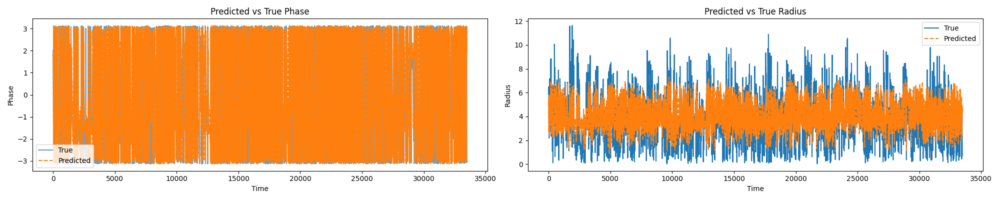

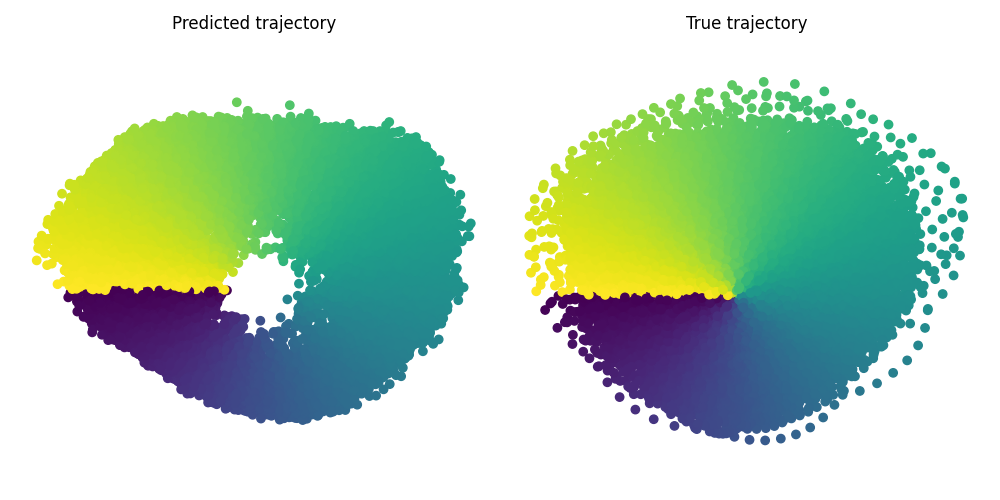

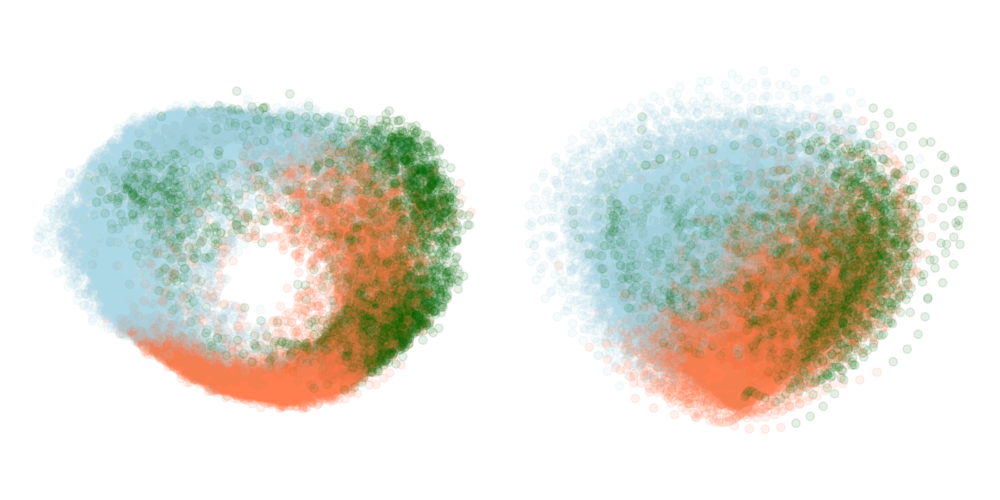

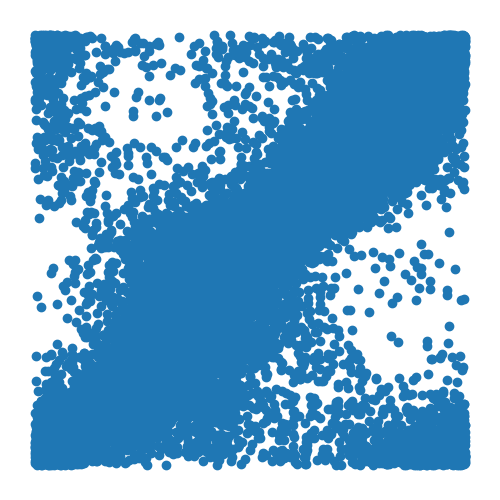

In [10]:

worm_angles, worm_radii = plot_prediction(
    model=model,
    inputs=[velocity, acceleration, worm_curvature, z_norm],
    y=y,
    T=T,
    y_train_mean=input_stats["y_mean"],
    y_train_std=input_stats["y_std"],
    z = z,
    cmap=cmap, normalize=normalize
)

worm_angles = [worm_angles[i*1594:(1+i)*1594] for i in range(20)]
worm_radii = [worm_radii[i*1594:(1+i)*1594] for i in range(20)]



# plot a worm

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


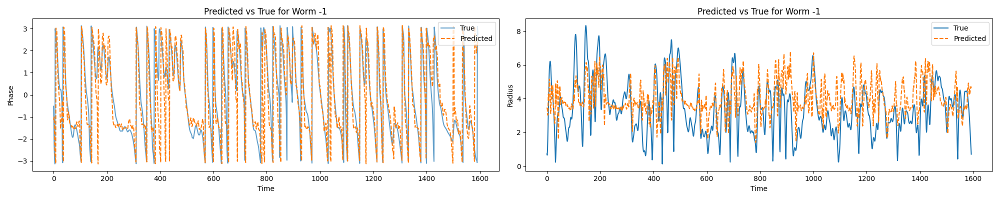

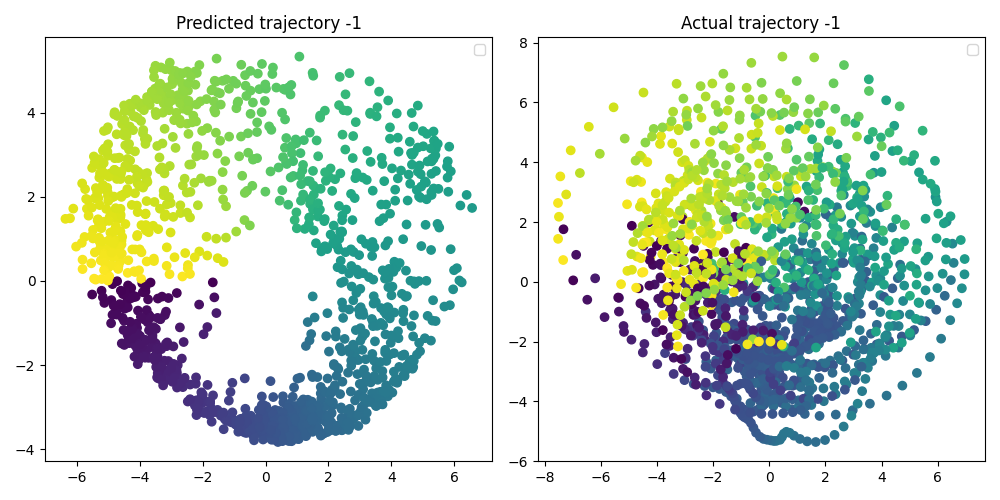

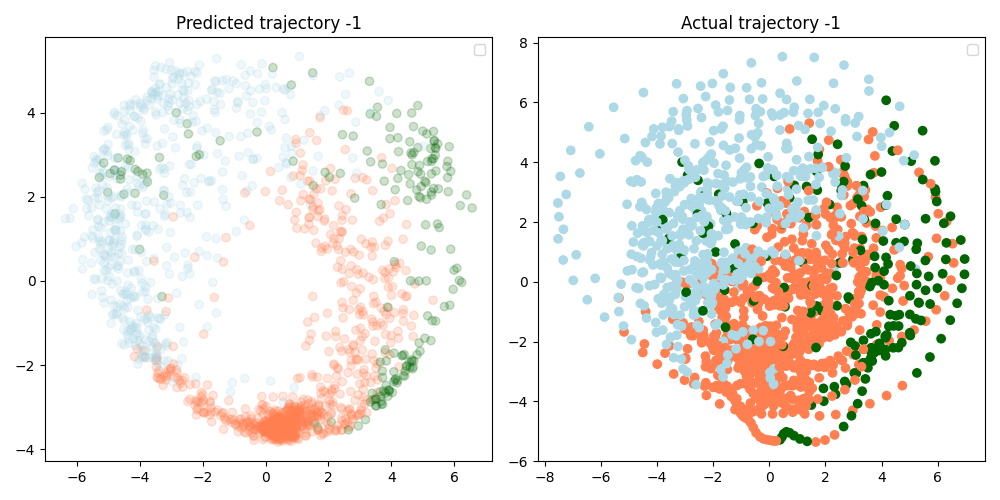

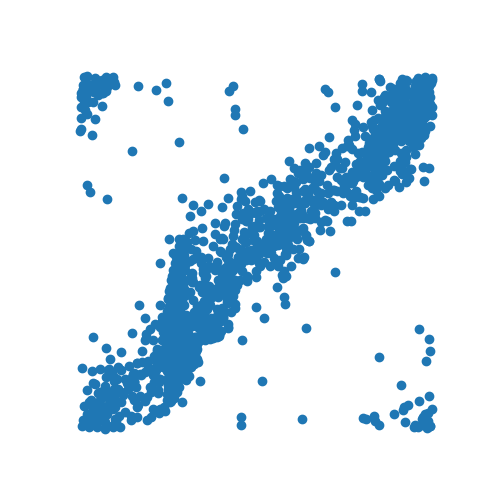

In [11]:

pred_test_angles, pred_test_radii = plot_held_out_worm(model, [velocity, acceleration, worm_curvature, z_norm], y, T, input_stats, new_worm_idx=-1,z=z, cmap=cmap, normalize=normalize)


# Store as new ground truth

In [12]:
T = 5
y = np.array((np.cos(np.concatenate(worm_angles)), np.sin(np.concatenate(worm_angles)), np.concatenate(worm_radii)))
y_new = np.array((np.cos(pred_test_angles), np.sin(pred_test_angles), pred_test_radii))
y = np.hstack((y, y_new))
y = np.array([y[:,i*1594:1594*(i+1)].T for i in range(21)])


# Activity-directed network

Epoch 0, Train Loss: 1.0847, Test Loss: 0.9536
Epoch 50, Train Loss: 0.2171, Test Loss: 0.1715
Epoch 100, Train Loss: 0.1660, Test Loss: 0.1375
Epoch 150, Train Loss: 0.1381, Test Loss: 0.1125
Epoch 200, Train Loss: 0.1186, Test Loss: 0.0870
Epoch 250, Train Loss: 0.1072, Test Loss: 0.0713
Epoch 300, Train Loss: 0.1008, Test Loss: 0.0639
Epoch 350, Train Loss: 0.0969, Test Loss: 0.0600
Epoch 400, Train Loss: 0.0929, Test Loss: 0.0567
Epoch 450, Train Loss: 0.0893, Test Loss: 0.0553
Final Training Loss: 0.0874
Final Test Loss: 0.0537


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(tensor([-1.9906, -2.5804, -2.9964,  ...,  1.7712,  1.7544,  1.7279]),
 tensor([3.4325, 3.6581, 3.9687,  ..., 4.2300, 4.1910, 4.1416]))

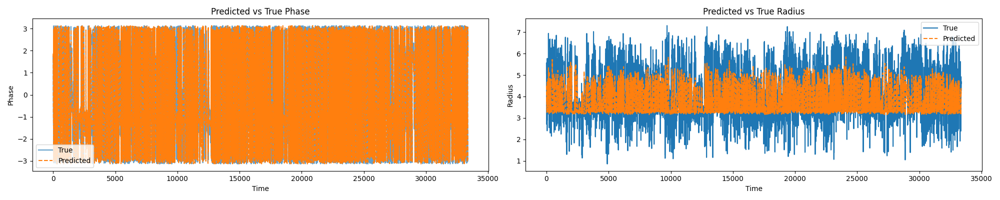

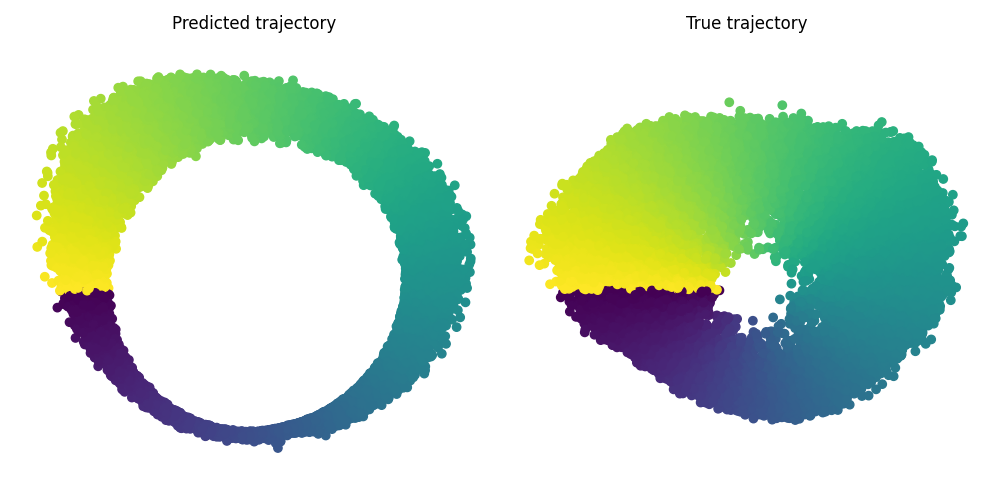

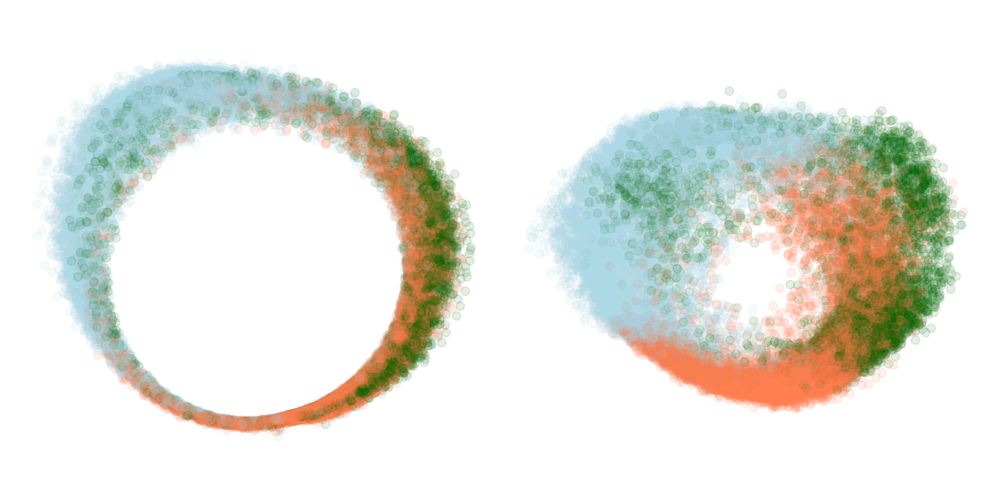

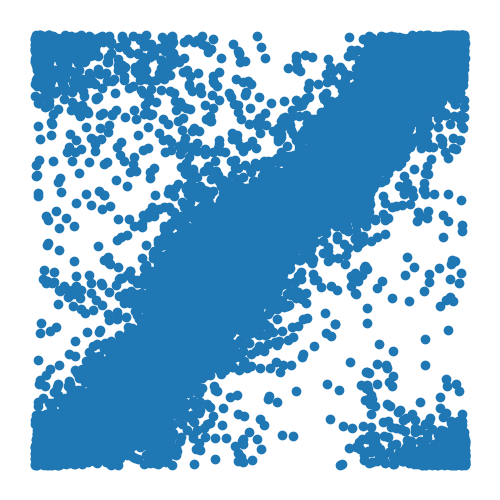

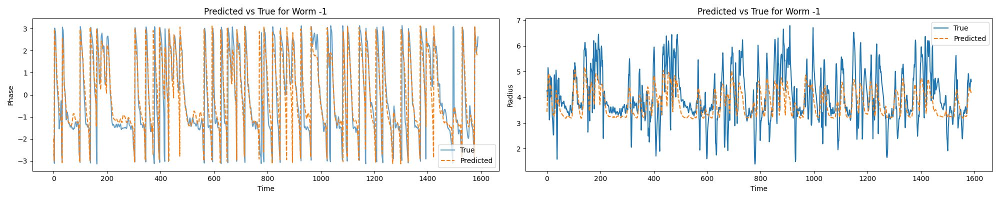

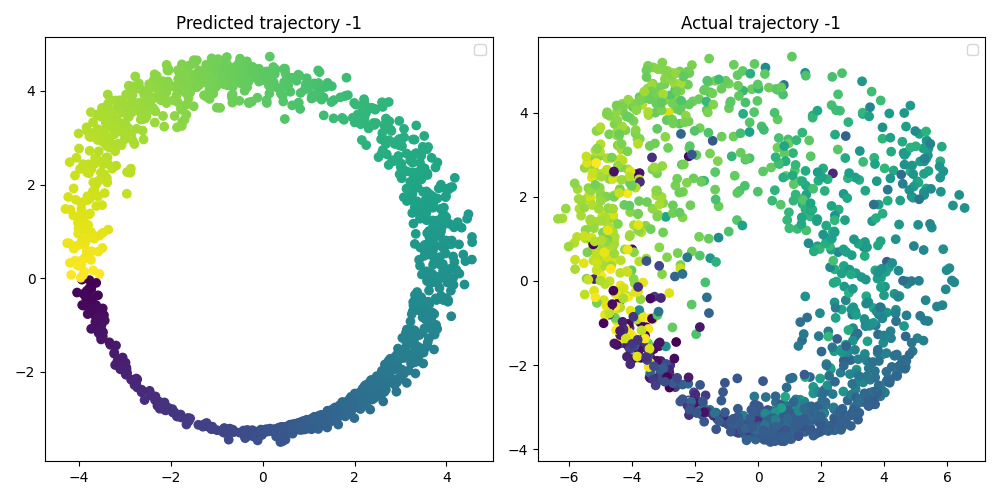

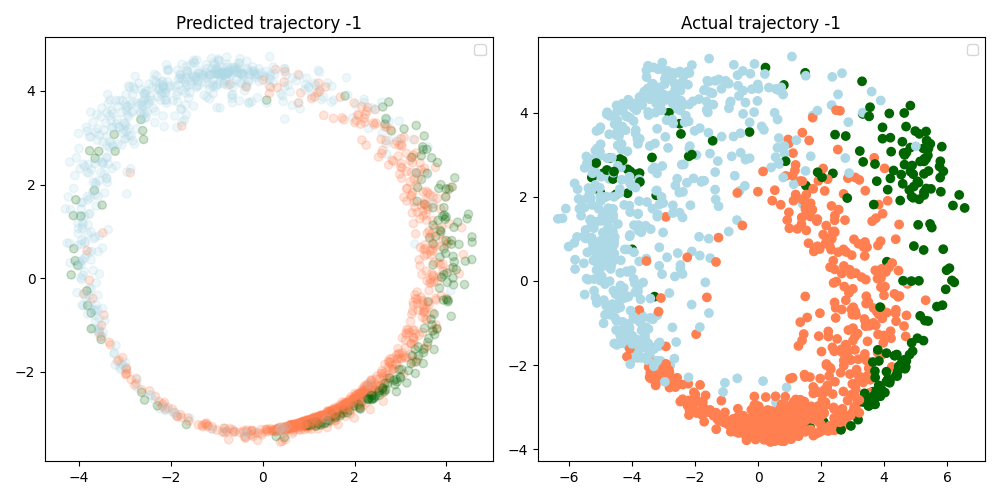

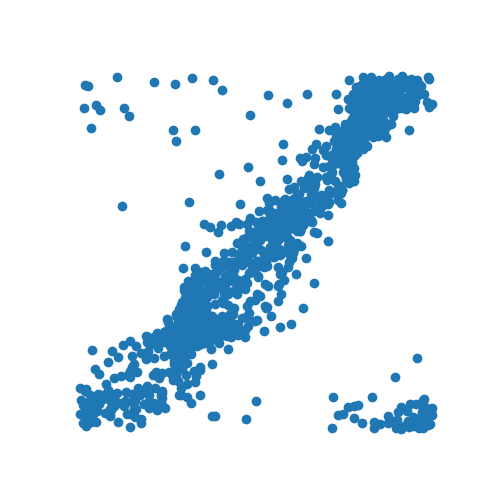

In [13]:
input_features = np.transpose(np.array(q_x)[:,5:], [2,0,1] )
X_all, y_all = prepare_data(input_features, y, T=T, holdout_idxs=[20])
X_train, X_test, y_train, y_test, input_stats = split_and_normalize(X_all, y_all, normalize=normalize)
model_type = 'ff'  # or 'ff'


input_dim = X_train.shape[-1]* X_train.shape[-2]
output_dim = y_train.shape[1]

model, train_losses, test_losses = train_model(
    X_train, y_train,
    X_test, y_test,
    input_dim=input_dim,
    output_dim=output_dim,
    model_type=model_type,
    hidden_dim=64,
    num_layers=3,
    dropout=0.5,
    learning_rate=0.001,
    num_epochs=500,
)

plot_prediction(
    model=model,
    inputs=input_features,
    y=y,
    T=T,
    y_train_mean=input_stats["y_mean"],
    y_train_std=input_stats["y_std"],
    z=np.array(z)[:,5:],
    cmap=cmap,
    normalize=normalize
)

plot_held_out_worm(model, input_features, y, T, input_stats, new_worm_idx=-1,z=np.array(z)[:,5:], cmap=cmap, normalize=normalize)


# behaviorally-directed network

Epoch 0, Train Loss: 1.1372, Test Loss: 1.0508
Epoch 50, Train Loss: 0.2216, Test Loss: 0.1178
Epoch 100, Train Loss: 0.1558, Test Loss: 0.0845
Epoch 150, Train Loss: 0.1289, Test Loss: 0.0719
Epoch 200, Train Loss: 0.1117, Test Loss: 0.0611
Epoch 250, Train Loss: 0.1009, Test Loss: 0.0521
Epoch 300, Train Loss: 0.0908, Test Loss: 0.0463
Epoch 350, Train Loss: 0.0843, Test Loss: 0.0415
Epoch 400, Train Loss: 0.0802, Test Loss: 0.0373
Epoch 450, Train Loss: 0.0764, Test Loss: 0.0344
Final Training Loss: 0.0742
Final Test Loss: 0.0323


/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/rslds/angle/plot_funcs.py:93: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(1, 1, figsize=(5, 5))
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  N

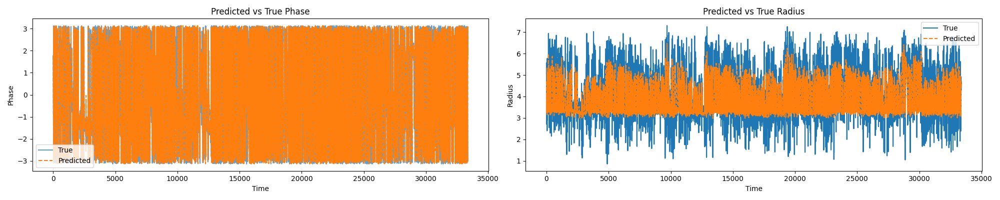

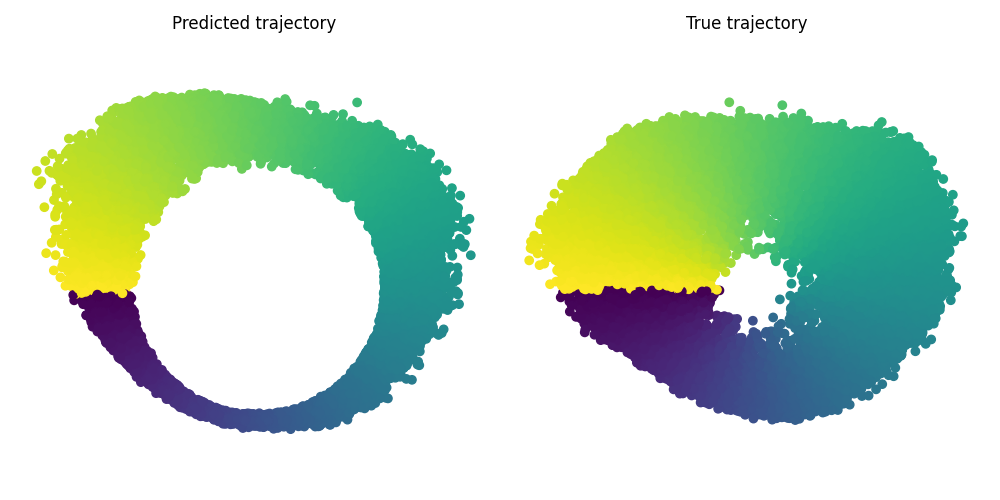

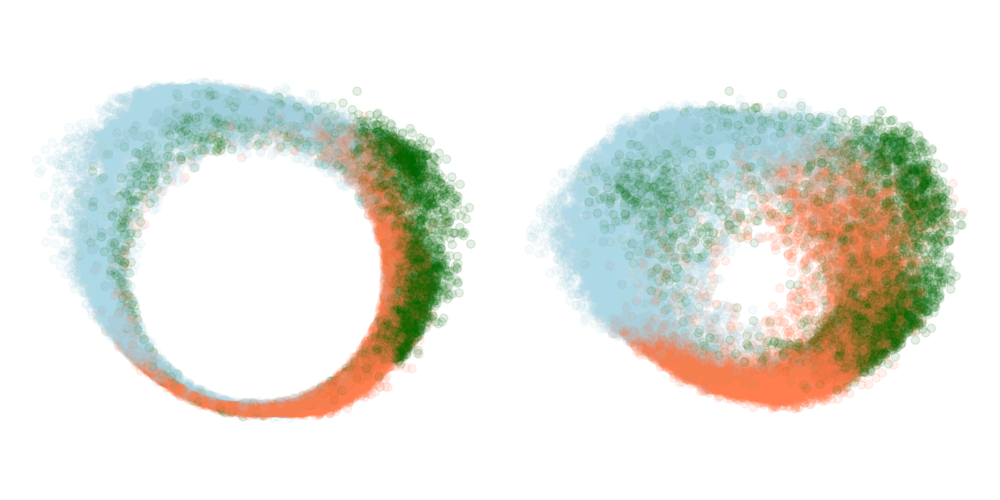

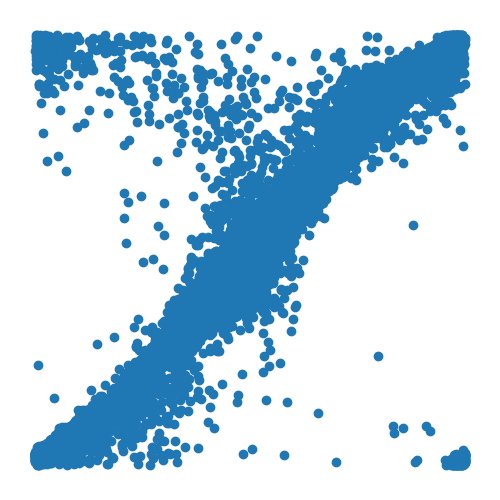

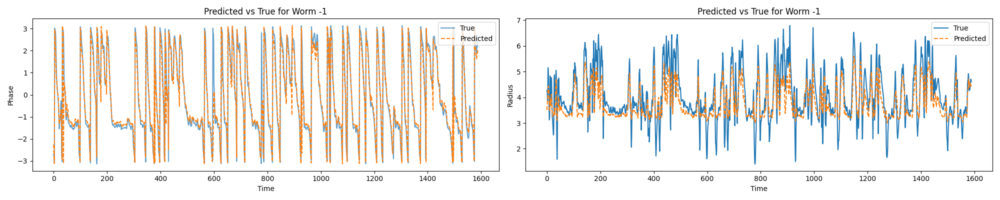

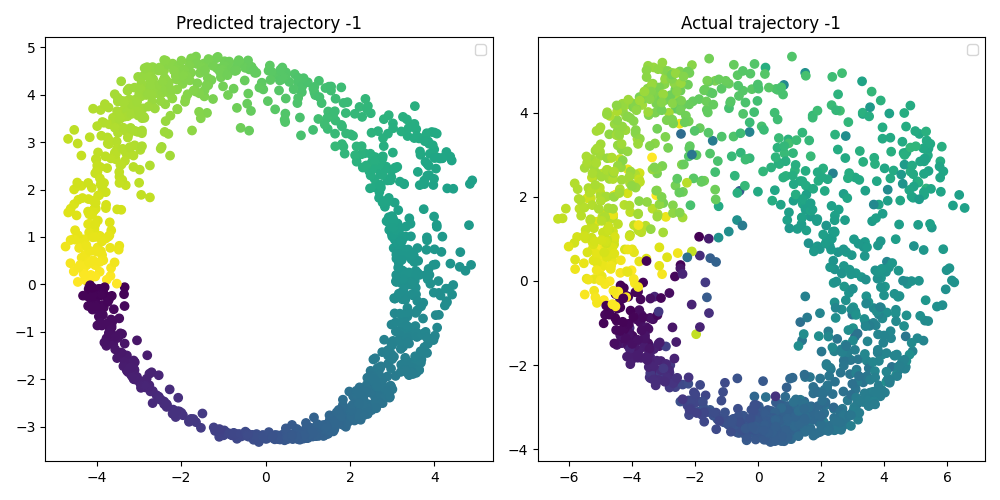

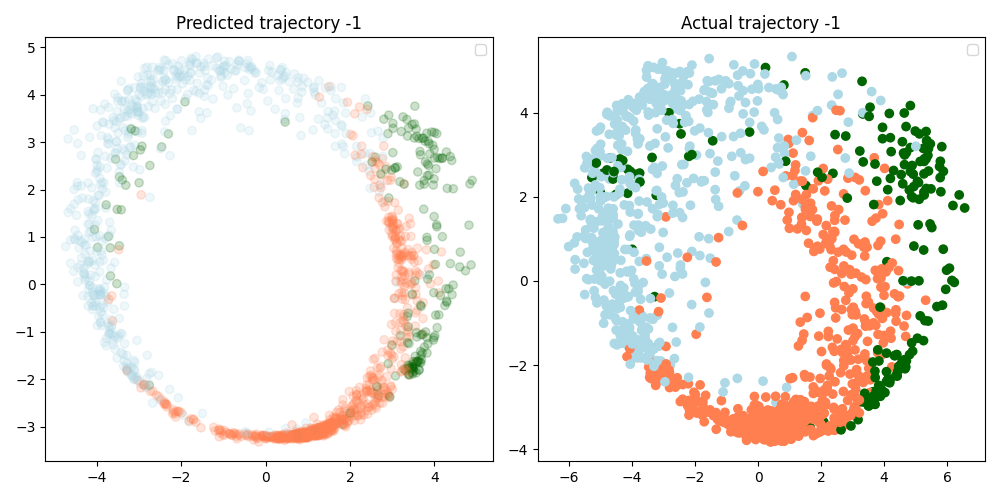

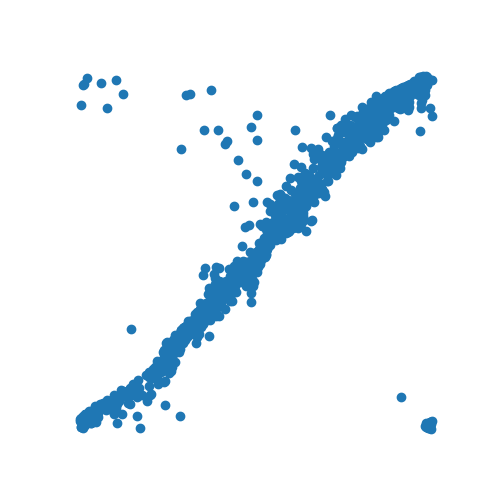

In [14]:
X_all, y_all = prepare_data(np.array([velocity, acceleration, worm_curvature, z_norm])[:,:,5:], y, T=T, holdout_idxs=[20])
X_train, X_test, y_train, y_test, input_stats = split_and_normalize(X_all, y_all, normalize=normalize)

input_dim = X_train.shape[-1]* X_train.shape[-2]
output_dim = y_train.shape[1]

model_type = 'ff'  # or 'ff'

model, train_losses, test_losses = train_model(
    X_train, y_train,
    X_test, y_test,
    input_dim=input_dim,
    output_dim=output_dim,
    model_type=model_type,
    hidden_dim=64,
    num_layers=3,
    dropout=0.5,
    learning_rate=0.001,
    num_epochs=500
)

worm_angles, worm_radii = plot_prediction(
    model=model,
    inputs=np.array([velocity, acceleration, worm_curvature, z_norm])[:,:,5:],
    y=y,
    T=T,
    y_train_mean=input_stats["y_mean"],
    y_train_std=input_stats["y_std"],
    z=np.array(z)[:,5:],
    cmap=cmap,
    normalize=normalize
)

worm_angles = [worm_angles[i*(1594-T):(1+i)*(1594-T)] for i in range(20)]
worm_radii = [worm_radii[i*(1594-T):(1+i)*(1594-T)] for i in range(20)]


# Assuming your data, model, and other relevant variables are loaded
pred_test_angles, pred_test_radii = plot_held_out_worm(model, np.array([velocity, acceleration, worm_curvature, z_norm])[:,:,5:], y, T, input_stats, new_worm_idx=-1,z=np.array(z)[:,5:],cmap=cmap, normalize=normalize)


# Phase respomse plot

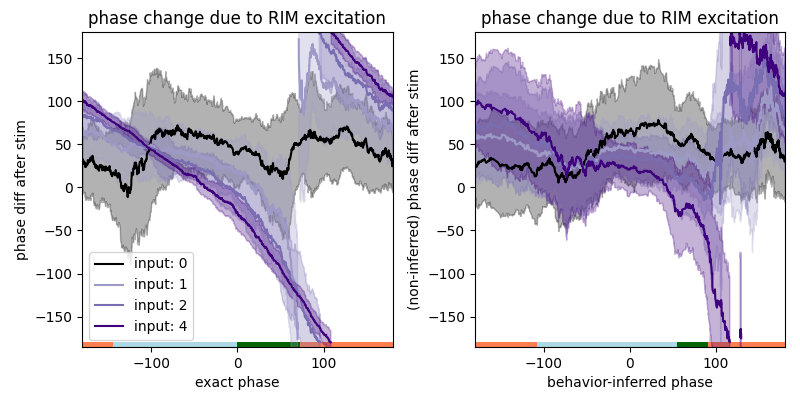

In [15]:
from scipy.stats import circmean, circstd, mode

def bin_phase_data(phases, data, num_bins=20, metric="mode"):
    """Bin the phase data and find the mode of the associated data in each bin."""
    # Define the bin edges
    bins = np.linspace(np.min(phases), np.max(phases), num_bins+1)  # Bins for phase data from -180 to 180 degrees
    binned_data = []
    binned_std = []

    # Find the bin indices for each phase
    bin_indices = np.digitize(phases, bins) - 1  # Get the correct bin for each phase

    # Loop over each bin and find the mode of the associated data
    for i in range(num_bins):
        # Mask the data corresponding to this bin
        bin_mask = bin_indices == i
        bin_data = data[bin_mask]
        
        # Compute the mode of the data in this bin
        if len(bin_data) > 0:  # Only compute mode if there is data in the bin
            if metric=="mode":
                mode_val, _ = mode(bin_data)
            else:
                mode_val = np.mean(bin_data)
                binned_std.append(np.std(bin_data))
            binned_data.append(mode_val)
        else:
            binned_data.append(np.nan)  # If no data in the bin, append NaN

    return bins[:-1], np.array(binned_data), np.array(binned_std)  #

def circular_stats(data, window_size=5):
    """Compute circular mean and standard deviation for smoothing PRC."""
    smoothed, std_dev = [], []
    for i in range(len(data)):
        start = max(0, i - window_size//2)
        end = min(len(data), i + window_size//2 + 1)
        smoothed.append(circmean(data[start:end], high=180, low=-180))
        std_dev.append(circstd(data[start:end], high=180, low=-180))
    return np.array(smoothed), np.array(std_dev)

def detect_discontinuities(phases, smoothed_shifts, threshold=90):
    """Break the plot where the phase shift jumps suddenly (e.g., near ±180°)."""
    phase_diff = np.abs(np.diff(smoothed_shifts, prepend=smoothed_shifts[0]))
    mask = phase_diff > threshold  # Detect large jumps
    smoothed_shifts_masked = np.copy(smoothed_shifts)
    smoothed_shifts_masked[mask] = np.nan  # Break the line where jumps occur
    return smoothed_shifts_masked

def plot_phase_resp(phase, response, z=[], label=None, ax=None, color=None):
    phase= np.array(phase)
    response = np.array(response)
    idx = np.argsort(phase)
    sorted_phase = phase[idx]
    sorted_response = response[idx]

    sorted_response_mean, sorted_response_var = circular_stats(sorted_response, window_size=50)
    sorted_response_mean = detect_discontinuities(sorted_phase, sorted_response_mean)


    if ax == None:
        fig,ax = plt.subplots()
    l1 = ax.plot(sorted_phase, sorted_response_mean, label=label, color=color)[0]
    ax.fill_between(sorted_phase, sorted_response_mean - sorted_response_var, sorted_response_mean+sorted_response_var, alpha = 0.3, color=l1.get_color())
    

    if np.size(z)>0:
        # find disc state by phase
        sorted_z = z[idx]
        #bin data, find mode of each bin
        _, states,_ = bin_phase_data(sorted_phase, sorted_z)

        ax.imshow(np.array(states)[np.newaxis,:], extent=[-180,180, -185,-180], cmap=cmap, vmin=0, vmax=6)

    ax.set_xlabel("Phase")
    ax.set_ylabel("Response")
    ax.set_ylim(-185, 180)
    ax.set_xlim(-180, 180)
    return ax

def compute_phase(x, pca):
    """Compute phase from the first two PCs."""
    x=pca.transform(x[np.newaxis,:])
    return np.degrees(np.arctan2(x[:, 1], x[:, 0]))  # PC2 vs PC1

def apply_perturbation(slds, prefix, input, pert_strength, pert_time):
    """Apply a perturbation at a specific time and return new phase trajectory."""
    T = input.shape[0]
    pert_input = input.copy()
    pert_input[pert_time] += pert_strength  # Small perturbation
    
    # Generate perturbed trajectory
    _, x_pert, _ = slds.sample(T=T, prefix=prefix, input=pert_input)
    return compute_phase(x_pert)

def phase_response_curve(slds, init_cons, input, pca, offset=-1):
    """Compute the phase response curve (PRC) by applying perturbations at different phases."""
    T = input.shape[0]

    phase_shifts = []
    orig_thetas = []
    final_thetas = []
    final_behs = []
    for i in range(init_cons.shape[0]):
        prefix = [np.array([0]), np.array([init_cons[i]]), np.array([np.zeros(slds.N)])]
        theta_orig = compute_phase(init_cons[i], pca)
        _, x_pert, _ = slds.sample(T=T, prefix=prefix, input=input)
        final_behs.append(beh_decoder.predict(x_pert)[offset])
        theta_pert = compute_phase(x_pert[-1], pca)
        delta_theta = np.unwrap(np.radians(theta_pert - theta_orig))  # Convert to radians and unwrap
        delta_theta = np.degrees(delta_theta)  # Convert back to degrees
        delta_theta = (theta_pert - theta_orig + 180) % 360 - 180 # Keep in 0 to 2π
        phase_shifts.append(delta_theta[0])
        orig_thetas.append(theta_orig[0])
        final_thetas.append(theta_pert[0])


    return orig_thetas, phase_shifts, final_thetas, final_behs



t=10
inputs = np.zeros((t,new_slds.M))
input_id = input_dict["RIM"]
input_str = 1
inputs[:,input_id] = input_str


fig,ax = plt.subplots(1,2, figsize=(8,4))
colors = [plt.get_cmap("Purples")(i) for i in np.linspace(0, 1, 7)][2:]
colors[0] = (0,0,0,1)

for input_str in [0,1,2,4]:
    phase, response, final, final_beh  = phase_response_curve(new_slds, q_x[-1], input_str*inputs, pca)
    plot_phase_resp(phase, response, q_z[-1], ax=ax[0], label=f"input: {input_str}", color=colors[input_str])

    plot_phase_resp((270-np.degrees(pred_test_angles))%360-180, response[5:], q_z[-1][5:], ax=ax[1], label=f"input: {input_str}", color=colors[input_str])

ax[0].set_xlabel("exact phase")
ax[0].set_ylabel("phase diff after stim")
ax[0].set_title("phase change due to RIM excitation")

ax[1].set_xlabel("behavior-inferred phase")
ax[1].set_ylabel("(non-inferred) phase diff after stim")
ax[1].set_title("phase change due to RIM excitation")

ax[0].legend()
fig.tight_layout()




# Phase reversal prob plot

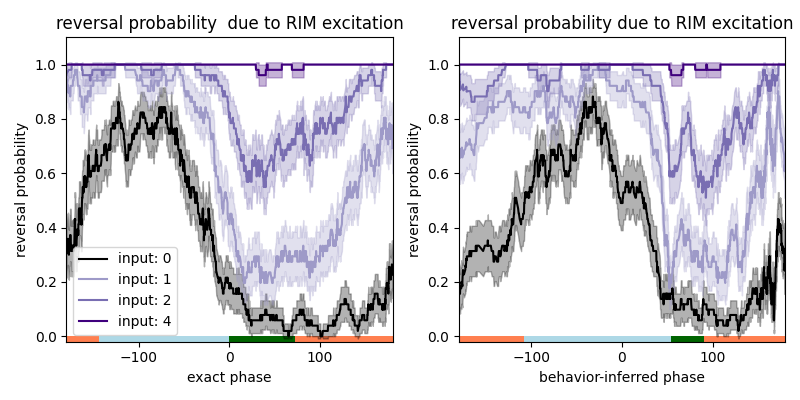

In [16]:


def plot_rev_prob(phase, beh, z=[], label=None, ax=None, color=None, window_size=50, beh1=True):
    phase= np.array(phase)
    if beh1:
        beh = np.array(beh) == 1
    idx = np.argsort(phase)
    sorted_phase = phase[idx]
    sorted_beh= beh[idx]

    sorted_beh_mean, sorted_beh_var = circular_stats(sorted_beh, window_size=window_size)


    if ax == None:
        fig,ax = plt.subplots()
    l1 = ax.plot(sorted_phase, sorted_beh_mean, label=label, color=color)[0]
    ax.fill_between(sorted_phase, sorted_beh_mean - sorted_beh_var/5, sorted_beh_mean+sorted_beh_var/5, alpha = 0.3, color=l1.get_color())
    

    if np.size(z)>0:
        # find disc state by phase
        sorted_z = z[idx]
        #bin data, find mode of each bin
        _, states,_ = bin_phase_data(sorted_phase, sorted_z)

        ax.imshow(np.array(states)[np.newaxis,:], extent=[-180,180, -0.02,0], cmap=cmap, vmin=0, vmax=6, aspect="auto")

    ax.set_xlabel("Phase")
    ax.set_ylabel("Response")
    ax.set_ylim(-0.02,1.1)
    ax.set_xlim(-180, 180)
    return ax








fig,ax = plt.subplots(1,2, figsize=(8,4))
colors = [plt.get_cmap("Purples")(i) for i in np.linspace(0, 1, 7)][2:]
colors[0] = (0,0,0,1)

for input_str in [0,1,2,4]:
    phase, response, final, final_beh  = phase_response_curve(new_slds, q_x[-1], input_str*inputs, pca)
    plot_rev_prob(phase, final_beh, q_z[-1], ax=ax[0],  label=f"input: {input_str}", color=colors[input_str])

    plot_rev_prob((270-np.degrees(pred_test_angles))%360-180, final_beh[5:], q_z[-1][5:], ax=ax[1], label=f"input: {input_str}", color=colors[input_str])

ax[0].set_xlabel("exact phase")
ax[0].set_ylabel("reversal probability")
ax[0].set_title("reversal probability  due to RIM excitation")

ax[1].set_xlabel("behavior-inferred phase")
ax[1].set_ylabel("reversal probability")
ax[1].set_title("reversal probability due to RIM excitation")

ax[0].legend()
fig.tight_layout()


worm_angles = np.array([np.radians((270-np.degrees(worm_angles[i]+np.pi))%360-180) for i in range(len(worm_angles))])
pred_test_angles = np.radians((270-np.degrees(pred_test_angles+np.pi))%360-180)

# Quantile matching

In [17]:
from scipy import interpolate

def match_cdf(source_data, target_data):

    source_data = np.asarray(source_data)
    target_data = np.asarray(target_data)

    sorted_source = np.sort(source_data)
    sorted_target = np.sort(target_data)

    source_cdf = np.linspace(0, 1, len(sorted_source))
    target_cdf = np.linspace(0, 1, len(sorted_target))
    source_to_cdf = interpolate.interp1d(sorted_source, source_cdf, bounds_error=False, fill_value=(0, 1))
    cdf_to_target = interpolate.interp1d(target_cdf, sorted_target, bounds_error=False, fill_value=(sorted_target[0], sorted_target[-1]))
    source_data_cdf = source_to_cdf(source_data)
    matched_data = cdf_to_target(source_data_cdf)

    return matched_data


# Experimental data

### Load it in

In [18]:
import pandas as pd

beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]

def rotate_angles(angles):
    return np.radians((270-np.degrees(angles + np.pi))%360-180)

def load_data(experiment, condition, neuron, hiscl_neuron=""):
    if experiment != "hiscl":
        return load_data_helper(experiment, condition, neuron)
    else: #stack together the data from diff strains
        if neuron == "AIB":
            return load_data_helper(experiment, condition, neuron, hiscl_neuron="RIM")
        elif neuron == "AVA":
            data1 = load_data_helper(experiment, condition, neuron, hiscl_neuron="RIM")
            data2 = load_data_helper(experiment, condition, neuron, hiscl_neuron="AIB")
        elif neuron == "RIM":
            data1 = load_data_helper(experiment, condition, neuron, hiscl_neuron="AVA")
            data2 = load_data_helper(experiment, condition, neuron, hiscl_neuron="AIB")

        data3 = []
        for i in range(len(data1)):
            data3.append(np.vstack((data1[i], data2[i])))

        if neuron == "AVA":
            for i in range(len(data3)):
                data3[i]= np.delete(data3[i], np.arange(1042,1137), axis=0)
        return data3


def load_data_helper(experiment, condition, neuron, hiscl_neuron=""):
    if neuron == "RIM":
        neuron_name = "RIMpReaChR"
        prefix=""
    elif neuron == "AIB":
        neuron_name = "AIBpChrimson"
        prefix= "_AIBC-3"
    elif neuron == "AVA":
        neuron_name = "AVApChrimson"
        prefix=""

    if experiment != "hiscl":
        prefix += f"_Aim1_{neuron}_{experiment}_{neuron_name}_"
    else:
        if neuron == "RIM":
            neuron_n = "RIMR"
            if hiscl_neuron == "AIB":
                prefix = f"_{neuron_n}x{hiscl_neuron}_Hiscl_60s_exp_{neuron_name}_{hiscl_neuron}_788_HisCl_"
            else:
                prefix = f"_{neuron_n}x{hiscl_neuron}_Hiscl_60s_exp_{neuron_n}_{hiscl_neuron}HisCl_"
        elif neuron == "AVA":
            if hiscl_neuron == "RIM":
                prefix = "031224_RIM_Hiscl_60s_exp__ZM10206_RIMHisCl_806_"
            else:
                prefix = "022324_AIB_Hiscl_60s_exp__ZM10206_AIBHisCl_788_"
        elif neuron == "AIB":
            if hiscl_neuron == "RIM":
                prefix = "_AIBC-3xRIM_Hiscl_60s_exp_AIBC-3_RIMHisCl_"




    path = f"exp_data/{experiment}/{neuron}/{condition}/"

    if experiment == "hiscl":
        path = f"exp_data/{experiment}/{neuron}/{hiscl_neuron}/{condition}/"

    if condition == "control":

        prefix += "atr0his0_"

        exp_vel = pd.read_csv(path+f"{prefix}speed_reshaped.csv", header=None)
        exp_acc = pd.read_csv(path+f"{prefix}acceleration_reshaped.csv", header=None)
        exp_curve = pd.read_csv(path+f"{prefix}body_angle_mag_reshaped.csv", header=None)
        exp_behaviors = pd.read_csv(path+f"{prefix}rev_reshaped.csv", header=None)
        pauses = pd.read_csv(path+f"{prefix}pause_reshaped.csv", header=None)
        turns = pd.read_csv(path+f"{prefix}turn_reshaped.csv", header=None)
        times = pd.read_csv(path+f"{prefix}frame_time_reshaped.csv", header=None)

        thresh_time = 667000
        exp_vel.values[times.values > thresh_time*6] = np.nan
        exp_acc.values[times.values > thresh_time*6] = np.nan
        exp_curve.values[times.values > thresh_time*6] = np.nan
        exp_behaviors.values[times.values > thresh_time*6] = np.nan
        pauses.values[times.values>thresh_time*6] = np.nan
        turns.values[times.values>thresh_time*6] = np.nan

        cutoff= 250
        exp_vel = exp_vel.dropna(axis=1, how="any").values[:,:cutoff].T
        exp_acc = exp_acc.dropna(axis=1, how="any").values[:,:cutoff].T
        exp_curve = exp_curve.dropna(axis=1, how="any").values[:,:cutoff].T
        exp_behaviors = exp_behaviors.dropna(axis=1, how="any").values[:,:cutoff].T
        pauses = pauses.dropna(axis=1, how="any").values[:,:cutoff].T
        turns = turns.dropna(axis=1, how="any").values[:,:cutoff].T

    else:
        if neuron == "AIB":
            cutoff = 10500
        else:
            cutoff = 195000

        if experiment == "time_titration":
            cutoff = 91*15

        assert np.floor(cutoff * 1.6/6) == cutoff * 1.6/6, "make sure cutoff is divisible by 15 bc itll throw an error based on timestep resampling"

        prefix += f"atr1his0_"

        exp_vel = pd.read_csv(path+f"{prefix}speed_reshaped.csv", header=None)[:cutoff]
        exp_acc = pd.read_csv(path+f"{prefix}acceleration_reshaped.csv", header=None)[:cutoff]
        exp_curve = pd.read_csv(path+f"{prefix}body_angle_mag_reshaped.csv", header=None)[:cutoff]
        exp_behaviors = pd.read_csv(path+f"{prefix}rev_reshaped.csv", header=None)[:cutoff]
        pauses = pd.read_csv(path+f"{prefix}pause_reshaped.csv", header=None)[:cutoff]
        turns = pd.read_csv(path+f"{prefix}turn_reshaped.csv", header=None)[:cutoff]


        # remove nans
        vel_nans = np.argwhere(exp_vel.isna().values.astype(int).sum(axis=0) >0)[:,0]
        vel_nans = [an for an in vel_nans]
        acc_nans = np.argwhere(exp_acc.isna().values.astype(int).sum(axis=0) >0)[:,0]
        acc_nans = [an for an in acc_nans]
        curve_nans = np.argwhere(exp_curve.isna().values.astype(int).sum(axis=0) >0)[:,0]
        curve_nans = [an for an in curve_nans]
        rev_nans = np.argwhere(exp_behaviors.isna().values.astype(int).sum(axis=0) >0)[:,0]
        rev_nans = [an for an in rev_nans]
        pause_nans = np.argwhere(pauses.isna().values.astype(int).sum(axis=0) >0)[:,0]
        pause_nans = [an for an in pause_nans]
        turn_nans = np.argwhere(turns.isna().values.astype(int).sum(axis=0) >0)[:,0]
        turn_nans = [an for an in turn_nans]


        all_nans = set()
        all_nans = all_nans.union(vel_nans)
        all_nans = all_nans.union(acc_nans)
        all_nans = all_nans.union(curve_nans)
        all_nans = all_nans.union(rev_nans)
        all_nans = all_nans.union(pause_nans)
        all_nans = all_nans.union(turn_nans)

        all_nans = np.array(list(all_nans))

        exp_vel = exp_vel.drop(columns=all_nans).values.T
        exp_acc = exp_acc.drop(columns=all_nans).values.T
        exp_curve = exp_curve.drop(columns=all_nans).values.T
        exp_behaviors = exp_behaviors.drop(columns=all_nans).values.T
        pauses = pauses.drop(columns=all_nans).values.T
        turns = turns.drop(columns=all_nans).values.T

    return exp_vel, exp_acc, exp_curve, exp_behaviors, pauses, turns
        


def plot_data(exp_vel, exp_acc, exp_curve, exp_behaviors, turns, experiment, fps=6, orig=True):
    fig,ax = plt.subplots(2,5, figsize=(18,6))
    if orig:
        im = ax[0,0].imshow(exp_vel, aspect="auto", interpolation="None", cmap="coolwarm", vmin=-500, vmax=500)
        #fig.colorbar(im)
        im = ax[0,1].imshow(exp_acc, aspect="auto", interpolation="None", cmap="coolwarm", vmin=-200, vmax=200)
    else:
        im = ax[0,0].imshow(exp_vel, aspect="auto", interpolation="None", cmap="coolwarm", vmin=-5, vmax=5)
        #fig.colorbar(im)
        im = ax[0,1].imshow(exp_acc, aspect="auto", interpolation="None", cmap="coolwarm", vmin=-5, vmax=5)
    #fig.colorbar(im)
    im = ax[0,2].imshow(exp_curve, aspect="auto", interpolation="None")
    #fig.colorbar(im)
    ax[0,3].imshow(exp_behaviors, aspect="auto", interpolation="None")
    #fig.colorbar(im)
    ax[0,4].imshow(turns, aspect="auto", interpolation="None")



    ax[1,0].plot(exp_vel.mean(axis=0))
    ax[1,0].set_xlim(0,exp_behaviors.shape[1])
    if orig:
        ax[1,0].set_ylim(-500,500)
        ax[1,1].set_ylim(-200,200)
        ax[1,2].set_ylim(0,30)
    else:
        ax[1,0].set_ylim(-5,5)
        ax[1,1].set_ylim(-5,5)
        ax[1,2].set_ylim(-5,5)



    ax[1,1].plot(exp_acc.mean(axis=0))
    ax[1,1].set_xlim(0,exp_behaviors.shape[1])

    ax[1,2].plot(exp_curve.mean(axis=0))
    ax[1,2].set_xlim(0,exp_behaviors.shape[1])

    ax[1,3].plot(exp_behaviors.mean(axis=0))
    ax[1,3].set_xlim(0,exp_behaviors.shape[1])
    ax[1,3].set_ylim(0,1)

    ax[1,4].plot(turns.mean(axis=0))
    ax[1,4].set_xlim(0,exp_behaviors.shape[1])
    ax[1,4].set_ylim(0,1)

    off= 105*fps

    if experiment == "duty_cycle":
        onsets = np.array([120*fps-off, 155*fps-off, 190*fps-off, 225*fps - off, 260*fps-off, 295*fps-off])
        offsets = onsets + 6*fps
    elif experiment == "time_titration":
        onsets = np.array([120*fps-off, 151*fps-off, 184*fps-off, 219*fps-off])
        offsets = onsets + np.array([1*fps, 3*fps, 5*fps, 10*fps])
    elif experiment == "hiscl":
        onsets = np.array([120*fps-off, 185*fps-off])
        offsets = onsets + np.array([5*fps, 5*fps])


    for i in range(2):
        for j in range(5):
            ax[0,j].set_xlim(0, exp_behaviors.shape[1])

            for stim_number in range(len(onsets)):
                ax[i,j].axvline(onsets[stim_number], color='k', lw=0.1*(1+stim_number%5))
                ax[i,j].axvline(offsets[stim_number], color='k', lw=0.1*(1+stim_number%5))


    ax[0,0].set_title("velocity")
    ax[0,1].set_title("acceleration")
    ax[0,2].set_title("curvature")
    ax[0,3].set_title("reversals")
    ax[0,4].set_title("turns")


    fig.tight_layout()

    return onsets.astype(int)

import scipy.stats as stats
from scipy.stats import mode


def replace_outliers_and_resample(values, threshold=9, original_fps=6, target_fps=1.6):
    values = np.array(values)
    
    z_scores = np.abs(stats.zscore(values, nan_policy='omit'))
    
    outliers = ((z_scores > threshold) + np.isnan(z_scores))>0
    indices = np.arange(len(values))
    clean_values = values.copy()
    clean_values[outliers] = np.interp(indices[outliers], indices[~outliers], values[~outliers])
    new_indices = np.linspace(0, len(clean_values) - 1, int(len(clean_values) * (target_fps / original_fps)))
    resampled_values = np.interp(new_indices, indices, clean_values)
    
    return resampled_values

def resample_binary(values, original_fps=6, target_fps=1.6):
    values = np.array(values)
    indices = np.arange(len(values))
    new_indices = np.linspace(0, len(values) - 1, int(len(values) * (target_fps / original_fps)))
    interpolated_values = np.interp(new_indices, indices, values)
    resampled_values = (interpolated_values >= 0.5).astype(int)
    
    return resampled_values


def reformat_data(exp_vel, exp_acc, exp_curve, exp_behaviors, turns, pauses, plot=False):

    if plot:
        fig,axs = plt.subplots(4, 3, figsize=(18,8))
        axs[0,0].set_ylabel("Steve's data")
        axs[1,0].set_ylabel("FB data (raw)")
        axs[2,0].set_ylabel("FB (interpolated)")
        axs[3,0].set_ylabel("FB (scaled n centered)")

        bins = [np.linspace(-6, 6, 1000), np.linspace(-5,5, 1000), np.linspace(-5, 5, 1000)]

        variables = ["velocity", "acceleration", "total curvature"]
        for i in range(3):
            quantity= X_all[:,0,i]
            axs[0,i].hist(quantity, bins=bins[i])
            axs[0,i].set_title(variables[i])


    all_vel = exp_vel.flatten()
    all_acc = exp_acc.flatten()
    all_curve = exp_curve.flatten()
    all_curve[all_curve == 0] = np.nan
    all_rev = exp_behaviors.flatten()
    all_pause = pauses.flatten()
    all_turn = turns.flatten()

    if plot:
        axs[1,0].hist(all_vel[all_pause == 1], bins=1000, density=True, color="purple", label="pause")
        axs[1,0].hist(all_vel[all_rev == 1], bins=1000, density=True, color=palette[1], label="rev")
        axs[1,0].hist(all_vel[(all_rev == 0)*(all_pause==0)], bins=1000, density=True, color=palette[0], label="fwd + turn")
        axs[1,0].hist(all_vel, bins=100, density=True, color='k', label="all")
        axs[1,0].legend()


        axs[1,1].hist(all_acc, bins=1000, density=True)
        axs[1,2].hist(all_curve, bins=1000, density=True)

    resampled_vel = replace_outliers_and_resample(all_vel)/1000
    resampled_acc = replace_outliers_and_resample(all_acc)/1000
    resampled_curve = replace_outliers_and_resample(all_curve)
    resampled_rev = resample_binary(all_rev)
    resampled_pause = resample_binary(all_pause)
    resampled_turn = resample_binary(all_turn)

    resampled_vel = resampled_vel.reshape((exp_vel.shape[0],-1))
    resampled_acc = resampled_acc.reshape((exp_vel.shape[0],-1))
    resampled_curve = resampled_curve.reshape((exp_vel.shape[0],-1))

    resampled_vel = smooth_trace(resampled_vel, 0.5).flatten()
    resampled_acc = smooth_trace(resampled_acc, 1.8).flatten()
    resampled_curve = smooth_trace(resampled_curve, 1).flatten()


    if plot:
        axs[2,0].hist(resampled_vel[resampled_pause == 1], bins=100, density=True, color="purple", label="pause")
        axs[2,0].hist(resampled_vel[resampled_rev == 1], bins=100, density=True, color=palette[1], label="rev")
        axs[2,0].hist(resampled_vel[(resampled_rev == 0)*(resampled_pause==0)], bins=100, density=True, color=palette[0], label="fwd + turn")
        axs[2,0].hist(resampled_vel, bins=100, density=True, color='k', label="all")
        axs[2,0].legend()



        axs[2,1].hist(resampled_acc, bins=1000)
        axs[2,1].set_xlim(axs[0,1].get_xlim())

        axs[2,2].hist(resampled_curve, bins=1000)
        axs[2,2].set_xlim(axs[0,2].get_xlim())


    criteria = (resampled_rev == 0) * (resampled_turn ==0)
    resampled_vel[criteria] = match_cdf(resampled_vel[criteria] , velocity.flatten()[z_flat== 0])

    criteria = (resampled_rev == 1) 
    resampled_vel[criteria] = match_cdf(resampled_vel[criteria] , velocity.flatten()[z_flat == 1])

    criteria = (resampled_turn ==1)
    resampled_vel[criteria] = match_cdf(resampled_vel[criteria] , velocity.flatten()[z_flat == 2])

    
    resampled_acc = match_cdf(resampled_acc, acceleration.flatten())

    resampled_curve = match_cdf(resampled_curve, worm_curvature.flatten())


    if plot:
        axs[3,0].hist(resampled_vel[resampled_rev == 1], bins=bins[0], density=True, color=palette[1], label="FB rev only")
        axs[3,0].hist(resampled_vel[(resampled_rev == 0)*(resampled_pause==0)], bins=bins[0], density=True, color=palette[0], label="FB fwd + turn only")
        # axs[3,0].hist(resampled_vel[(resampled_pause==1)], bins=100, density=True, color="purple", label="FB pause only")

        axs[3,0].hist(resampled_vel, bins=bins[0], density=True, label="FB all")


        axs[3,1].hist(resampled_acc, bins=bins[1], density=True, label="FB")
        axs[3,1].set_xlim(axs[0,1].get_xlim())


        axs[3,2].hist(resampled_curve, bins=bins[2], density=True, label="FB")
        axs[3,2].set_xlim(axs[0,2].get_xlim())

        for i in range(3):
            quantity= X_all[:,0,i]
            axs[3,i].hist(quantity, bins=bins[i], alpha=0.3, density=True, label="steve")
            axs[3,i].legend()

        fig.tight_layout()



    resampled_vel = resampled_vel.reshape((exp_vel.shape[0],-1))
    resampled_acc = resampled_acc.reshape((exp_vel.shape[0],-1))
    resampled_curve = resampled_curve.reshape((exp_vel.shape[0],-1))
    resampled_rev = resampled_rev.reshape((exp_vel.shape[0],-1))
    resampled_turn = resampled_turn.reshape((exp_vel.shape[0],-1))

    # resampled_vel = smooth_trace(resampled_vel, 0.5)
    # resampled_acc = smooth_trace(resampled_acc, 1.8)
    # resampled_curve = smooth_trace(resampled_curve, 1)

    

    return resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn

import scipy
def create_X_sequences(X, T):
    X_seq = []
    for i in range(len(X) - T):
        X_seq.append(X[i:i+T])  
    return torch.stack(X_seq)

def circular_moving_success_stats(theta, values, window_size):

    theta = np.radians(theta)
    smoothed_rates = np.zeros_like(values, dtype=float)
    smoothed_sem = np.zeros_like(values, dtype=float)

    for i, t in enumerate(theta):
        # Compute circular distances
        circular_diff = np.abs(np.angle(np.exp(1j * (theta - t))))  # Circular distance
        mask = circular_diff <= window_size / 2  # Select points within window

        if np.any(mask):
            local_values = values[mask]
            smoothed_rates[i] = np.nanmean(local_values)  # Compute success rate (fraction of 1s)
            smoothed_sem[i] = scipy.stats.sem(local_values)
        else:
            smoothed_rates[i] = values[i]  # Default to original if no neighbors
            smoothed_sem[i] = 0  # No variance in a single point

    return smoothed_rates, smoothed_sem


def plot_rev_pro2(phase, beh, z=[], label=None, ax=None, color=None, window_size=50, beh1=True, 
                  plot_type="box", num_bins=6, vert=True):

    phase = np.array(phase)
    if beh1:
        beh = np.array(beh) == 1  # Convert to boolean

    idx = np.argsort(phase)
    sorted_phase = phase[idx]
    sorted_beh = beh[idx]

    # Compute smoothed behavioral response
    sorted_beh_mean, sorted_beh_std = circular_moving_success_stats(sorted_phase, sorted_beh, window_size=window_size)
    #sorted_beh_std = np.sqrt(sorted_beh_mean*(1-sorted_beh_mean)/len(idx))

    #sorted_beh_mean = sorted_beh

    if ax is None:
        fig, ax = plt.subplots()

    if plot_type == "line":
        # Line plot with shaded standard deviation
        l1 = ax.plot(sorted_phase, sorted_beh_mean, label=label, color=color)[0]
        ax.fill_between(sorted_phase, sorted_beh_mean - sorted_beh_std , 
                        sorted_beh_mean + sorted_beh_std , alpha=0.3, color=l1.get_color())

    elif plot_type == "box":
        # Bin phase data
        bin_edges = np.linspace(-180, 180, num_bins + 1)
        bin_centers = (bin_edges[:-1] + bin_edges[1:]) / 2
        bin_indices = np.digitize(sorted_phase, bin_edges) - 1  # Assign each phase to a bin

        # Collect data in bins from the smoothed response
        binned_data = [sorted_beh_mean[bin_indices == i] for i in range(num_bins)]  
        
        # Remove empty bins
        valid_bins = [i for i, data in enumerate(binned_data) if len(data) > 0]
        bin_centers = bin_centers[valid_bins]
        binned_data = [binned_data[i] for i in valid_bins]
        print([(sum(~np.isnan(bd))) for bd in binned_data])

        boot_data = []
        for bd in binned_data:
            bin_boot = []
            for i in range(1000):
                n_samples = 4
                idx2 = np.arange(len(bd))
                np.random.shuffle(idx2)
                bin_boot.append(bd[idx2[:n_samples]].mean())
            boot_data.append(np.array(bin_boot))

        filtered_data = []
        filtered_positions = []

        ### Uncomment if you want to Filter out bins with fewer than X samples
        for data, pos in zip(binned_data, bin_centers):
            if len(data) >= 8:
                filtered_data.append(data)
                filtered_positions.append(pos)

        filtered_data = binned_data
        filtered_positions=bin_centers

        # Plot boxplot using the smoothed behavioral response
        ax.boxplot(filtered_data, positions=filtered_positions, widths=(360 / num_bins) * 0.7, patch_artist=True,
                   boxprops=dict(facecolor=color, alpha=0.7, edgecolor="k"), showfliers=False,
                   medianprops=dict(color="black"), manage_ticks=False, vert=vert)
        

    # Optional: Plot discrete states
    if np.size(z) > 0:
        sorted_z = z[idx]
        _, states, _ = bin_phase_data(sorted_phase, sorted_z)
        ax.imshow(np.array(states)[np.newaxis, :], extent=[-180, 180, -0.02, 0], cmap=cmap, vmin=0, vmax=6, aspect="auto")

    if vert: 
        ax.set_xlabel("Phase")
        ax.set_ylabel("Rev. prob")
        ax.set_ylim(-0.02, 1.1)
        ax.set_xlim(-180, 180)
    else:
        ax.set_xlim(-0.02, 1.1)
        ax.set_ylim(-180, 180)

    if plot_type == "box":
        return ax, np.array([bin_i.mean() for bin_i in boot_data])
    else:
        return ax



def phase_response_curve2(slds, init_cons, input, pca, offset=-1, thresh=3, remove_rev = False):
    T = input.shape[0]
    init_behs = np.concatenate(np.array(z[0:5])[:,10:]) # assuming init_cons == np.concatenate(np.array(q_x[0:5])[:,10:])

    phase_shifts = []
    orig_thetas = []
    final_thetas = []
    final_behs = []
    all_behs = []
    for i in range(init_cons.shape[0]):
        prefix = [np.array([0]), np.array([init_cons[i]]), np.array([np.zeros(slds.N)])]
        theta_orig = compute_phase(init_cons[i], pca)
        _, x_pert, y_pert = slds.sample(T=T, prefix=prefix, input=input)
        x_est = y_pert@(np.linalg.pinv(slds.emissions.Cs[0]).T)
        if init_behs[i] == 1 and remove_rev:
            final_behs.append(np.nan)
        else:
            final_behs.append((beh_decoder.predict(x_est)[0:] == 1).sum()>=thresh)
        theta_pert = compute_phase(x_pert[-1], pca)
        delta_theta = np.unwrap(np.radians(theta_pert - theta_orig))  # Convert to radians and unwrap
        delta_theta = np.degrees(delta_theta)  # Convert back to degrees
        delta_theta = (theta_pert - theta_orig + 180) % 360 - 180 # Keep in 0 to 2π
        phase_shifts.append(delta_theta[0])
        orig_thetas.append(theta_orig[0])
        final_thetas.append(theta_pert[0])
        all_behs.append(beh_decoder.predict(x_est)[0:])


    return orig_thetas, phase_shifts, final_thetas, final_behs, all_behs



def analyze_data(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, times, lag=16, inclusion_thresh =3, model_type="LSTM", remove_revs=False): 
    T = 5 #num time lags

    if remove_revs:
        rev_id = beh_map[1]
    else:
        rev_id = 100000

    behavior_input = np.array(resampled_rev+2*resampled_turn, dtype=np.float64)
    behavior_input -= np.array(z).mean()
    behavior_input /= np.array(z).std()

    inferred_phases = np.zeros((len(times), len(resampled_vel))) +np.nan
    inferred_rad = np.zeros((len(times), len(resampled_vel))) +np.nan
    final_behaviors = np.zeros((len(times), len(resampled_vel))) +np.nan
    initial_behaviors = np.zeros((len(times), len(resampled_vel))) +np.nan
    initial_cts_beh = np.zeros((len(times), len(resampled_vel))) +np.nan

    final_behaviors_all = []
    inferred_phases_all = []
    inferred_rad_all = []
    behaviors_all = []
    X_all_LSTM = []
    for new_worm_idx in range(len(resampled_vel)):
        X_new_worm = np.stack([resampled_vel[new_worm_idx], resampled_acc[new_worm_idx], resampled_curve[new_worm_idx], behavior_input[new_worm_idx]], axis=1)  
        # X_new_worm = np.stack([resampled_vel[new_worm_idx], resampled_acc[new_worm_idx], behavior_input[new_worm_idx]], axis=1)  
        X_new_tensor = torch.tensor(X_new_worm, dtype=torch.float32)

        if T > 0:
            X_new_seq1 = create_X_sequences(X_new_tensor, T)
        else: 
            X_new_seq1 = X_new_tensor
        

        # Normalize the inputs
        X_train_mean, X_train_std = X_new_seq1.mean(axis=0), X_new_seq1.std(axis=0)
        if normalize:
            X_new_seq1 = (X_new_seq1 - X_train_mean) / (X_train_std + 1e-8)  

        if model_type == "LSTM":
            model.eval()  # Set model to evaluation mode
            with torch.no_grad():
                y_new_pred = model(X_new_seq1).squeeze()
            
        else:
            model.eval()
            with torch.no_grad():
                y_new_pred = model(X_new_seq1).squeeze()


        
        X_all_LSTM.append(X_new_seq1)
        
        # Denormalize the predicted outputs
        y_new_pred = y_new_pred * input_stats["y_std"] + input_stats['y_mean']  #note: y_train_std,  y_train_mean come from earlier

        inferred_phases_all.append(np.arctan2(y_new_pred[:-lag, 1], y_new_pred[:-lag, 0]))
        inferred_rad_all.append(y_new_pred[:-lag,2])
        behaviors_all.append(behavior_input[new_worm_idx][T:-lag])
        final_behaviors_all.append(np.array([resampled_rev[new_worm_idx][t:t+lag].sum()>=inclusion_thresh for t in range(T,resampled_rev[new_worm_idx].shape[0]-lag)]))
        
        for i, end_time in enumerate(times):
            if np.abs(behavior_input[new_worm_idx][end_time-1] - rev_id) > 0.01:
                inferred_phases[i, new_worm_idx] = np.arctan2(y_new_pred[end_time-T-1, 1], y_new_pred[end_time-T-1, 0])
                inferred_rad[i,new_worm_idx] = y_new_pred[end_time-T-1, 2]
                final_behaviors[i, new_worm_idx] = resampled_rev[new_worm_idx][end_time:end_time+lag].sum()>=inclusion_thresh
                initial_behaviors[i, new_worm_idx] = behavior_input[new_worm_idx][end_time-1]
                initial_cts_beh[i, new_worm_idx] = resampled_vel[new_worm_idx][end_time-1]
                
                
            # else:
            #     inferred_phases[i, new_worm_idx] = np.arctan2(y_new_pred[end_time-T-1, 1], y_new_pred[end_time-T-1, 0])
            #     final_behaviors[i, new_worm_idx] = np.nan
        

    inferred_phases = np.array(inferred_phases)
    final_behaviors = np.array(final_behaviors)
    final_behaviors_all = np.concatenate(final_behaviors_all)
    inferred_phases_all= np.concatenate(inferred_phases_all)
    inferred_rad_all= np.concatenate(inferred_rad_all)
    behaviors_all = np.concatenate(behaviors_all)

    inferred_phases = rotate_angles(inferred_phases)
    inferred_phases_all = rotate_angles(inferred_phases_all)


    return inferred_phases, final_behaviors, final_behaviors_all, inferred_phases_all, inferred_rad_all, behaviors_all, inferred_rad, initial_behaviors, initial_cts_beh, X_all_LSTM




In [19]:
def simulate_exp(input_strs, input_durs, neuron, total_dur=5, thresh=1, remove_rev = False):

    if (len(input_durs) == 1) and (len(input_strs) == 1):
        pass
    else:
        if len(input_durs) == 1:
            input_durs = input_durs*len(input_strs)
        if len(input_strs) == 1:
            input_strs = input_strs*len(input_durs)

    inputs = np.zeros((total_dur,new_slds.M))
    input_id = input_dict[neuron]
    
    final_behs = []
    for i in range(len(input_strs)):
        inputs[:input_durs[i],input_id] = input_strs[i]
        results = phase_response_curve2(new_slds, np.concatenate(np.array(q_x[0:5])[:,10:]), inputs, pca, offset=-8, thresh=thresh, remove_rev=remove_rev)
        final_behs.append(results[3])
        
    return final_behs


def plot_results(idxs, inferred_phases, final_behaviors, combined, ax, colors, window_size= np.pi/4, num_bins=6, noise_level=0, plot_type="box", vert=True):
    if combined == False:
        for i in idxs:
            # plot_rev_pro2((270-np.degrees(inferred_phases[i] + np.pi+ noise_level*(-0.5+np.random.rand(inferred_phases[i].size))))%360-180, final_behaviors[i], ax=ax, color=colors[i+1], window_size=window_size, beh1=False, plot_type=plot_type, num_bins=num_bins)
            plot_rev_pro2(np.degrees(inferred_phases[i]), final_behaviors[i], ax=ax, color=colors[i+1], window_size=window_size, beh1=False, plot_type=plot_type, num_bins=num_bins)
    else:
        # plot_rev_pro2((270-np.degrees(np.concatenate(inferred_phases[idxs]) + np.pi+ noise_level*(-0.5+np.random.rand(np.concatenate(inferred_phases[idxs]).size))))%360-180, np.concatenate(final_behaviors[idxs]), ax=ax, color=colors[-1], window_size=window_size, beh1=False, plot_type=plot_type, num_bins=num_bins, vert=vert)
        plot_rev_pro2(np.degrees(np.concatenate(inferred_phases[idxs])), np.concatenate(final_behaviors[idxs]), ax=ax, color=colors[-1], window_size=window_size, beh1=False, plot_type=plot_type, num_bins=num_bins, vert=vert)




# Kernel regression funcs

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, log_loss, roc_auc_score
from sklearn.model_selection import train_test_split
from scipy.stats import vonmises, norm
from sklearn.metrics import accuracy_score, log_loss
from sklearn.model_selection import train_test_split
import numpy as np

import numpy as np
from scipy.stats import vonmises, norm

def circular_distance(theta1, theta2):
    return np.angle(np.exp(1j * (theta1 - theta2)))

def kernel_regression_2d(
    X_train, y_train, X_eval,
    h_x=0.3, h_y=0.3,
    circular_x=True,
    kernel_type=("vonmises", "gaussian"),  # or ("uniform", "uniform")
    return_std=False
):
    x, y = X_train[:, 0], X_train[:, 1]
    x_eval, y_eval = X_eval[:, 0], X_eval[:, 1]
    z_est = np.zeros(len(x_eval))
    z_std = np.zeros(len(x_eval))

    for i in range(len(x_eval)):


        if kernel_type[0] == "vonmises" and circular_x:
            wx = vonmises.pdf(circular_distance(x, x_eval[i]), kappa=1/h_x)
        elif kernel_type[0] == "gaussian":
            wx = norm.pdf((x - x_eval[i]) / h_x)
        elif kernel_type[0] == "uniform":
            angle_diff = circular_distance(x, x_eval[i])
            wx = ((np.abs(angle_diff) <= h_x).astype(float)) / (2 * h_x)
        else:
            raise ValueError(f"Unsupported y kernel type: {kernel_type[1]}")

        # Y-axis kernel
        if kernel_type[1] == "gaussian":
            wy = norm.pdf((y - y_eval[i]) / h_y)
        elif kernel_type[1] == "uniform":
            wy = ((np.abs(y - y_eval[i]) <= h_y).astype(float)) / (2 * h_y)
        else:
            raise ValueError(f"Unsupported y kernel type: {kernel_type[1]}")

        weights = wx * wy
        w_sum = weights.sum()

        if w_sum > 0:
            weights /= w_sum
            z_est[i] = np.sum(weights * y_train)
            if return_std:
                var = np.sum(weights * (y_train - z_est[i])**2)
                n_eff = 1.0 / np.sum(weights**2)
                z_std[i] = np.sqrt(var) / np.sqrt(n_eff)
        else:
            z_est[i] = np.nan
            if return_std:
                z_std[i] = np.nan

    return (z_est, z_std) if return_std else z_est


def fit_and_evaluate(
    X,
    y,
    method="kernel",
    plot=True,
    ax=None,
    bandwidths=(0.3, 0.3),
    kernel_type=("vonmises", "gaussian"),
    test_size=0.2,
    random_state=0,
    plot_points=100, alpha=1, return_est = False
):
    X = np.atleast_2d(X)
    if X.shape[0] != len(y):
        X = X.T

    if X.shape[1] != 2:
        raise ValueError("This function assumes X has shape (n_samples, 2)")

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )

    if method == "logistic":
        model = LogisticRegression()
        model.fit(X_train, y_train)
        y_prob = model.predict_proba(X_test)[:, 1]

    elif method == "kernel":
        h_x, h_y = bandwidths
        y_prob, _ = kernel_regression_2d(
            X_train, y_train, X_test,
            h_x=h_x, h_y=h_y, kernel_type=kernel_type, return_std=True
        )

    else:
        raise ValueError("Method must be 'logistic' or 'kernel'")

    y_pred = (y_prob >= 0.5).astype(int)

    try:
        acc = accuracy_score(y_test, y_pred)
        ll = log_loss(y_test, y_prob, labels=[0, 1])
        auc = roc_auc_score(y_test, y_prob)
    except:
        pass

    if plot:
        if ax is None:
            fig, ax = plt.subplots(figsize=(6, 4))

        if method == "logistic":
            # Plot prediction as function of βᵀx (decision axis)
            coefs = model.coef_[0]
            intercept = model.intercept_[0]

            # Project training inputs onto decision axis
            proj_train = X_train @ coefs + intercept
            proj_grid = np.linspace(proj_train.min()-4, proj_train.max()+4, plot_points)
            X_eval = np.outer(np.ones_like(proj_grid), coefs)
            X_eval = proj_grid[:, None] * coefs / np.linalg.norm(coefs)**2
            X_eval = X_eval  # already in direction of coefs, rescaled
            z_vals = X_eval @ coefs + intercept
            y_plot = 1 / (1 + np.exp(-z_vals))

            ax.plot(z_vals, y_plot, label="Logistic Regression", color="C1")
            z_test = X @ coefs + intercept
            ax.scatter(z_test, y, c='k', alpha=0.3, s=20, label="Test Labels")
            ax.set_xlabel("β₀ + β₁x₀ + β₂x₁")

        elif method == "kernel":
            # Plot prediction as function of x0, with x1 fixed at mean
            x0_grid = np.linspace(-np.pi, np.pi, plot_points)
            x1_mean = np.mean(X_train[:, 1])
            X_eval = np.column_stack([x0_grid, np.full_like(x0_grid, x1_mean)])
            y_plot, y_sem = kernel_regression_2d(
                X_train, y_train, X_eval,
                h_x=bandwidths[0], h_y=bandwidths[1],
                kernel_type=kernel_type, return_std=True
            )
            # y_sem *= 1.96
            ax.plot(x0_grid, y_plot, label="Kernel Regression", color="purple", alpha = alpha)
            ax.fill_between(x0_grid, y_plot - y_sem, y_plot + y_sem, color="purple", label="±1 SEM", alpha=alpha)
            ax.set_xlabel(r"$\theta$")

            # ax.scatter(X_test[:, 0], y_test, c='k', alpha=0.3, s=20, label="Test Labels")
        ax.set_ylabel("P(y=1)")
        ax.set_title(f"{method.capitalize()} Regression")
        plt.tight_layout()

    if return_est:
        x0_grid = np.linspace(-np.pi, np.pi, plot_points)
        x1_mean = np.mean(X_train[:, 1])
        X_eval = np.column_stack([x0_grid, np.full_like(x0_grid, x1_mean)])
        y_plot, y_sem = kernel_regression_2d(
                X_train, y_train, X_eval,
                h_x=bandwidths[0], h_y=bandwidths[1],
                kernel_type=kernel_type, return_std=True
            )
        return y_plot
    return acc, ll, auc


# q_y = [slds.smooth(q_x[w], Y[w]) for w in range(21)]
q_y = [Y[w] for w in range(21)]
angles_cat = np.concatenate(worm_angles)
radii_cat = np.concatenate(worm_radii)
neurons_cat = np.concatenate(np.array(q_y[:20])[:,10:])
z_cat = np.concatenate(np.array(z[:20])[:,10:])


y_est2s = []
for neuron_name in ["AVA", "RIM", "AIB"]:


    neuron_act = neurons_cat[:, neural_labels == f"F - {neuron_name}"][:,0]
    x0,x1 = angles_cat,radii_cat
    y = neuron_act

    x = np.stack((x0, x1)).T
    x = x[y!=0]
    y = y[y!=0]

    y_est2 = fit_and_evaluate(x, y, method="kernel", bandwidths=(1,0.3), plot=False, kernel_type=("uniform", "gaussian"), alpha = 0.1 + 0.2*(2%5), return_est=True)
    y_est2s.append(y_est2)


# Load and adjust data

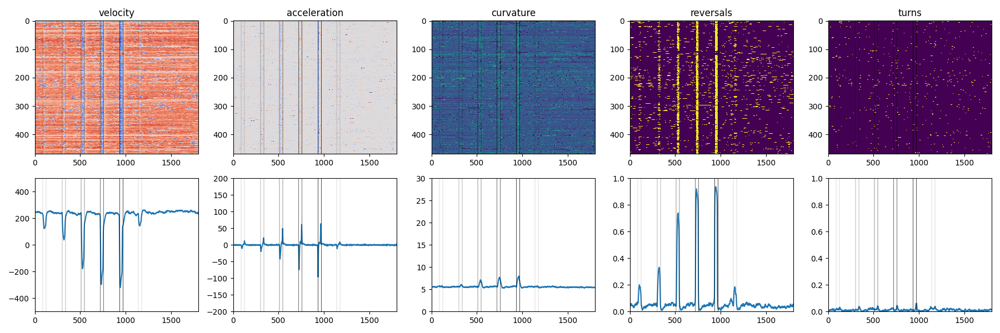

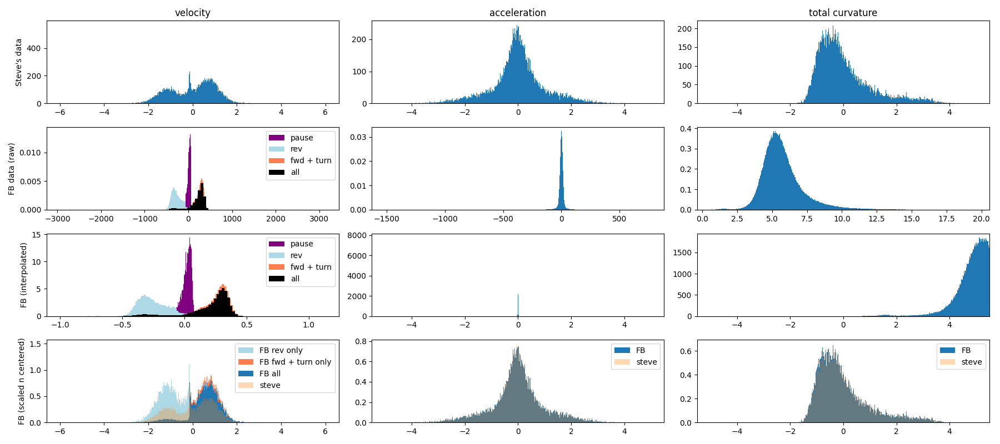

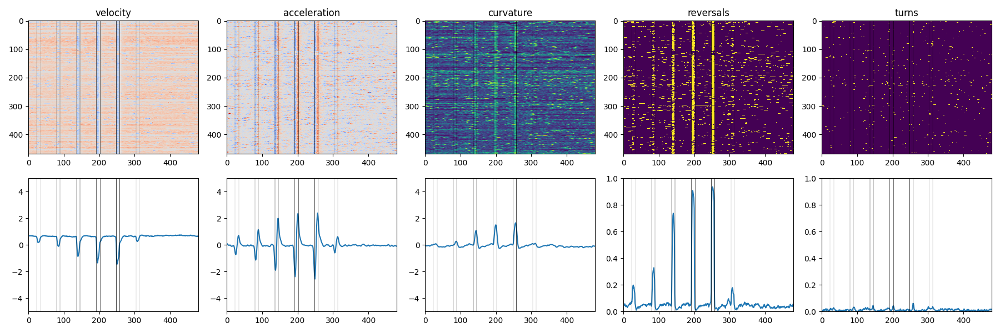

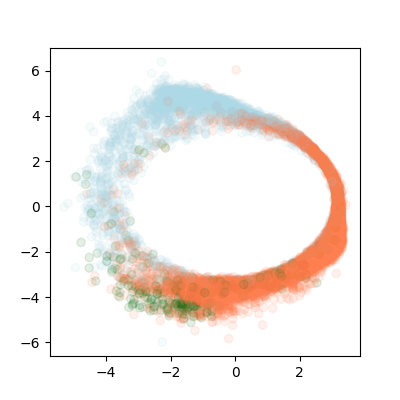

In [26]:
experiment = "duty_cycle"
condition = "exp"
neuron = "AVA"


exp_vel, exp_acc, exp_curve, exp_behaviors, pauses, turns = load_data(experiment, condition, neuron)
exp_onsets = plot_data(exp_vel, exp_acc, exp_curve, exp_behaviors, turns, experiment, fps=6)
resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn = reformat_data(exp_vel, exp_acc, exp_curve, exp_behaviors, turns, pauses, plot=True)
onsets = plot_data(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, experiment, fps=1.6, orig = False)


times = onsets
inferred_phases, final_behaviors, final_behaviors_all, inferred_phases_all, inferred_rad_all, behaviors_all, inferred_rad, initial_behaviors, initial_cts_beh, X_all_LSTM = analyze_data(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, times, lag=16, inclusion_thresh = 2, model_type="ff", remove_revs=False)

fig,ax = plt.subplots(figsize=(4,4))
donut_x = inferred_rad_all*np.cos(inferred_phases_all)
donut_y = inferred_rad_all*np.sin(inferred_phases_all)

ax.scatter(donut_x[::10], donut_y[::10], c=behaviors_all[::10], cmap=cmap, vmin=-1, vmax=7, alpha = 0.1)



In [27]:

def latency_to_reversal(reshaped_rev, start_time, max_latency=None):
    n_worms, T = reshaped_rev.shape
    latencies = np.full(n_worms, np.nan)

    for i in range(n_worms):
        end_time = T if max_latency is None else min(T, start_time + max_latency)
        future = reshaped_rev[i, start_time:end_time]
        reversal_indices = np.where(future)[0]
        if reversal_indices.size > 0:
            latencies[i] = reversal_indices[0]
    
    return latencies



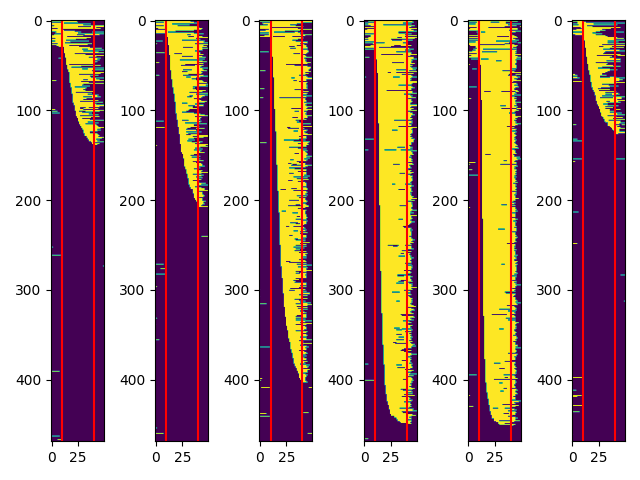

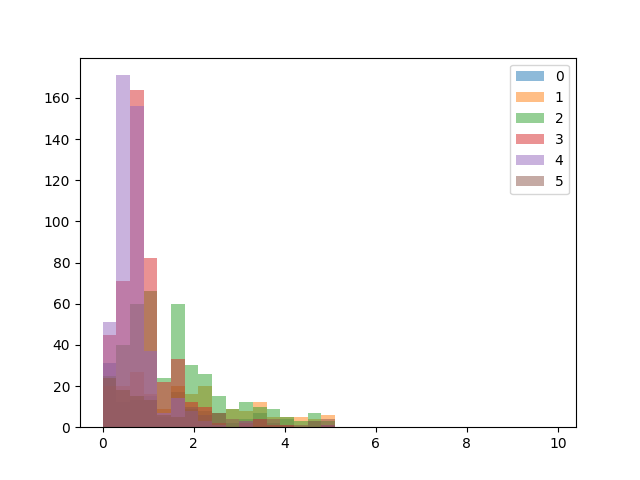

In [28]:
if experiment == "time_titration":
    durations = [1,3,5,10]
else:
    durations = [5,5,5,5,5,5]
    if experiment == "hiscl":
        durations = [5,5]

exp_offsets = np.array([exp_onsets[i] + 6*durations[i] for i in range(len(durations))])


fig,ax = plt.subplots(1,len(durations))
fig2,ax2 = plt.subplots()

latencies = []
for i in range(len(durations)):
    latency = latency_to_reversal(exp_behaviors, exp_onsets[i], max_latency = 6*durations[i]+1)
    idx = np.argsort(latency)
    ax[i].imshow(exp_behaviors[idx, -10+exp_onsets[i]:exp_offsets[i]+10], aspect="auto")
    ax[i].axvline(10, c='r')
    ax[i].axvline(10+6*durations[i], c='r')
    ax2.hist(latency/6, bins = np.arange(0,10,.3), alpha = 0.5, label=i)
    # latency[np.isnan(latency)] = np.nanmax(latency)+1
    latencies.append(latency)
fig.tight_layout()
latencies = np.array(latencies)/6
ax2.legend()

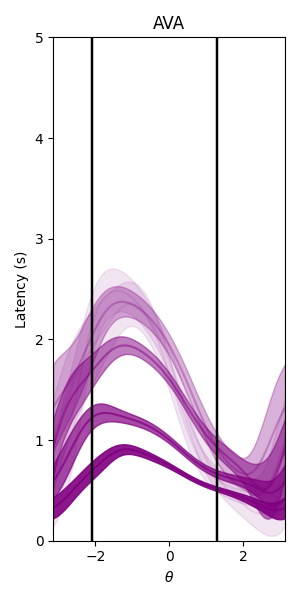

In [ ]:
# Plot
fig,ax = plt.subplots(figsize=(3,6))
idxs = [[0],[1],[2],[3],[4],[5]]
# idxs = [[0,1,2,3]]
# idxs = [[0],[1]]
for i in range(len(idxs)):

    x0,x1 = np.concatenate(inferred_phases[idxs[i]]), np.concatenate(inferred_rad[idxs[i]])
    y = np.concatenate(latencies[idxs[i]])

    x = np.stack((x0, x1)).T
    x = x[~np.isnan(y)]
    y = y[~np.isnan(y)]

    
    
    y_est = fit_and_evaluate(x, y, method="kernel", bandwidths=(0.3,0.3), plot=True, kernel_type=("vonmises", "gaussian"), ax=ax, alpha = 0.1 + 0.2*(i%5), return_est=True)
    ax.set_xlabel(r"$\theta$")
    ax.set_ylabel("Latency (s)")
    ax.set_ylim(0,5)
    ax.set_title(neuron)
    ax.axvline(-2.1, color='k')
    ax.axvline(1.3, color='k')
    ax.set_xlim(-np.pi, np.pi)


# simulate data

In [32]:
try: #no need to redo it
    final_behs
except:
    final_behs = simulate_exp([0,1,3,5], input_durs=[8], neuron=neuron, total_dur=8, thresh=2, remove_rev=False)

# plot

(0.0, 40.0)

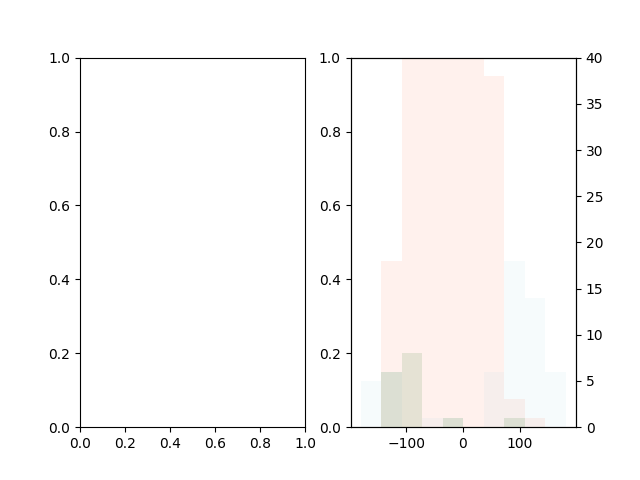

In [34]:
fig,ax_2 = plt.subplots(1,2)
ax2 = ax_2[1].twinx()
idxs=[0,-1]
transformed_angles = np.degrees(np.concatenate(inferred_phases[[idxs]]))
# transformed_angles = (transformed_angles)%360 - 180
behs = np.concatenate(initial_behaviors[[idxs]])
beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]
for i in range(3):
    ax2.hist(transformed_angles[np.abs(behs -beh_map[i]) < 0.01], bins=np.linspace(-180,181,11), density=False, alpha=0.1, color=palette[i])
ax2.set_ylim(0,40)

In [35]:
ax_2[0].set_title(neuron)
colors = [plt.get_cmap("Purples")(i) for i in np.linspace(0, 1, 7)][1:]
colors[0] = (0,0,0,1)



times = onsets
inferred_phases, final_behaviors, final_behaviors_all, inferred_phases_all, inferred_rad_all, behaviors_all, inferred_rad, initial_behaviors, initial_cts_beh, X_all_LSTM = analyze_data(resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn, times, lag=8, inclusion_thresh = 3, model_type="ff", remove_revs=False)


for i in range(len(final_behs)):
    test_angs = np.concatenate(worm_angles[0:5])
    plot_rev_pro2(np.degrees(test_angs), final_behs[i], np.concatenate(np.array(q_z[0:5])[:,5+T:]), ax=ax_2[0],  label=f"input: {input_str}", color=colors[i], window_size=np.pi/4, plot_type="line", num_bins=10)

if condition == "control":
    plot_rev_pro2(np.degrees(inferred_phases_all[:10000]), final_behaviors_all[:10000], ax=ax_2[1], color="k", window_size=np.pi/4, beh1=False, plot_type="line", num_bins=10)
    ax_2[1].set_title("control")
else:
    plot_results([0,1,2,3], inferred_phases, final_behaviors, combined=False, ax=ax_2[1], colors=colors[:], num_bins=10, window_size=np.pi/4, plot_type="box", noise_level=0)
    ax_2[1].set_title(neuron)


ax_2[0].set_xlabel(r"$\theta$")
ax_2[1].set_xlabel(r"$\theta$")

# ax_2[1].set_xlim(-120,50)
# ax_2[0].set_xlim(-120,50)

fig.tight_layout()


[4, 8, 26, 65, 286, 36, 20, 9, 12, 3]
[4, 14, 19, 59, 271, 61, 24, 8, 5, 4]
[5, 12, 30, 47, 239, 84, 30, 15, 6, 1]
[5, 13, 28, 31, 190, 98, 70, 17, 13, 4]


# Kernel regression

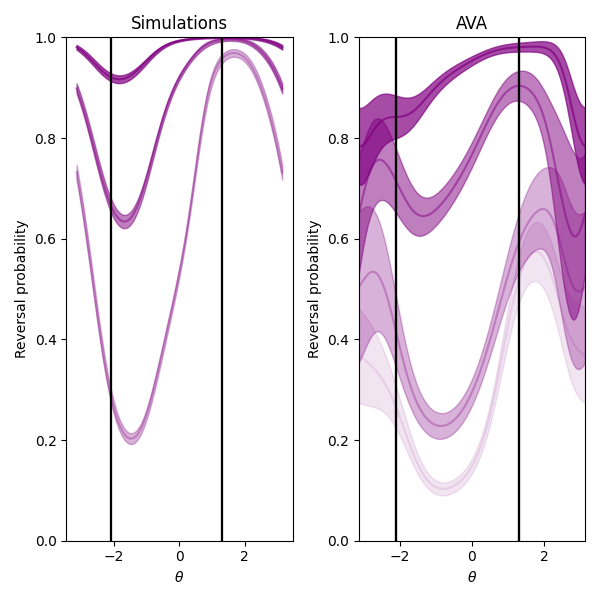

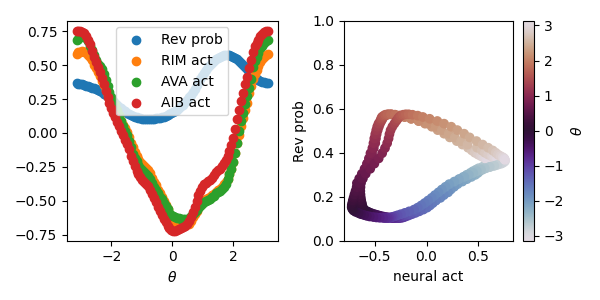

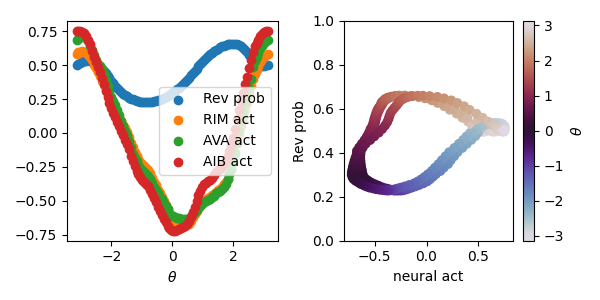

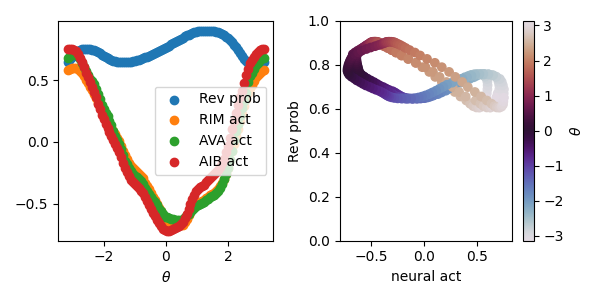

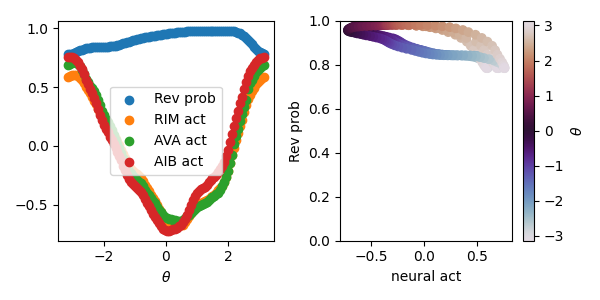

In [49]:

# Plot
fig,ax = plt.subplots(1,2,figsize=(6,6))

if neuron == "AVA":
    idxs = [[0,-1],[1],[2], [3,4]]
if neuron == "RIM":
    idxs = [[0,-1],[1], [2,3,4]]
if neuron == "AIB":
    idxs = [[0,-1],[1,2], [3,4]]

for i in range(len(idxs)):

    x0,x1 = np.concatenate(inferred_phases[idxs[i]]), np.concatenate(inferred_rad[idxs[i]])
    y = np.concatenate(final_behaviors[idxs[i]])
    x = np.stack((x0, x1)).T
    x = x[~np.isnan(y)]
    y = y[~np.isnan(y)]

    
    
    y_est = fit_and_evaluate(x, y, method="kernel", bandwidths=(0.3,0.3), plot=True, kernel_type=("vonmises", "gaussian"), ax=ax[1], alpha = 0.1 + 0.2*(i%5), return_est=True)
    ax[1].set_xlabel(r"$\theta$")
    ax[1].set_ylabel("Reversal probability")
    ax[1].set_ylim(0,1)
    ax[1].set_title(neuron)
    ax[1].axvline(-2.1, color='k')
    ax[1].axvline(1.3, color='k')
    ax[1].set_xlim(-np.pi, np.pi)


    if True: # plot rev probability vs mean trace
        fig2,ax2  = plt.subplots(1,2, figsize=(6,3))
        ax2[0].scatter(np.linspace(-np.pi, np.pi, 100), y_est, label="Rev prob")

        neuron_names = ["RIM", "AVA", "AIB"]
        i = 0
        for y_est2 in y_est2s:
            ax2[0].scatter(np.linspace(-np.pi, np.pi, 100), y_est2, label=f"{neuron_names[i]} act")
            im = ax2[1].scatter(y_est2, y_est, c = np.linspace(-np.pi, np.pi, 100), cmap="twilight")
            i+=1


        ax2[0].set_xlabel(r"$\theta$")
        cb = fig.colorbar(im)
        cb.set_label(r"$\theta$")
        ax2[1].set_ylabel("Rev prob")
        ax2[1].set_xlabel(f"neural act")
        ax2[1].set_ylim(0,1)
        ax2[0].legend()
        fig2.tight_layout()


for i in range(1,len(final_behs)):


    x0,x1 = np.concatenate(worm_angles[0:5]), np.concatenate(worm_radii[0:5])
    y = np.array(final_behs[i])
    x = np.stack((x0, x1)).T
    x = x[~np.isnan(y)]
    y = y[~np.isnan(y)]


    
    
    y_est = fit_and_evaluate(x, y, method="kernel", bandwidths=(0.3,0.3), plot=True, kernel_type=("vonmises", "gaussian"), ax=ax[0], alpha = 0.1 + 0.2*(i%5), return_est=True)


    ax[0].set_xlabel(r"$\theta$")
    ax[0].set_ylabel("Reversal probability")
    ax[0].set_title("Simulations")
    ax[0].axvline(-2.1, color='k')
    ax[0].axvline(1.3, color='k')
    ax[0].set_ylim(0,1)


fig.tight_layout()
